In [1]:
# Imports we will use
import torch
import gc
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torch.autograd import Function
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import pandas as pd
import random
from pathlib import Path
from sklearn.metrics import r2_score
from astropy.visualization import make_lupton_rgb
from sklearn.manifold import Isomap
from train_utils import *
import time
import os
import json

%matplotlib inline

os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

# Set Seed
torch.manual_seed(22)

# Find if cuda is available
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


In [2]:
# Load in data
head = Path.cwd().parents[1]
source_img_path = head / 'data/delve_source_3/delve_source_3.npy'
target_img_path = head / 'data/delve_target_3/delve_target_3.npy'
source_meta = head / 'data/delve_source_3/delve_source_3_metadata.csv'
target_meta = head / 'data/delve_target_3/delve_target_3_metadata.csv'
batch_size = 32
source_train_dataloader, source_test_dataloader, source_val_dataloader, source_data = create_dataloader(source_img_path, source_meta, batch_size)
target_train_dataloader, target_test_dataloader, target_val_dataloader, target_data = create_dataloader(target_img_path, target_meta, batch_size)

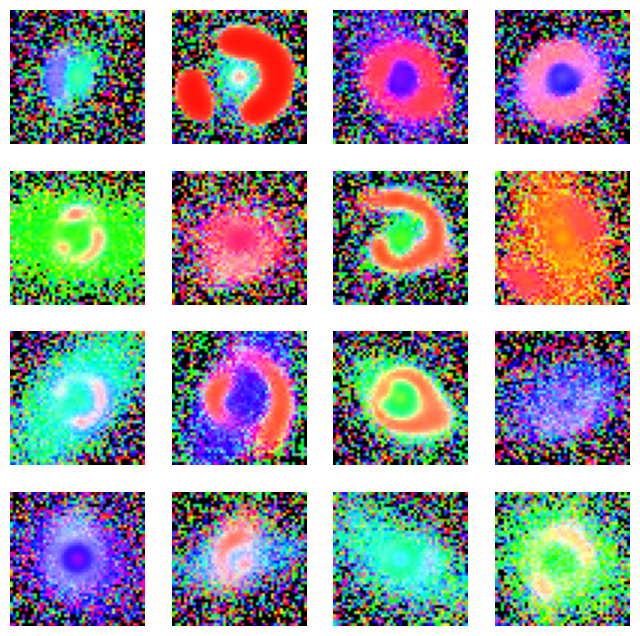

In [3]:
# Visualize source data
visualize_data(source_data)

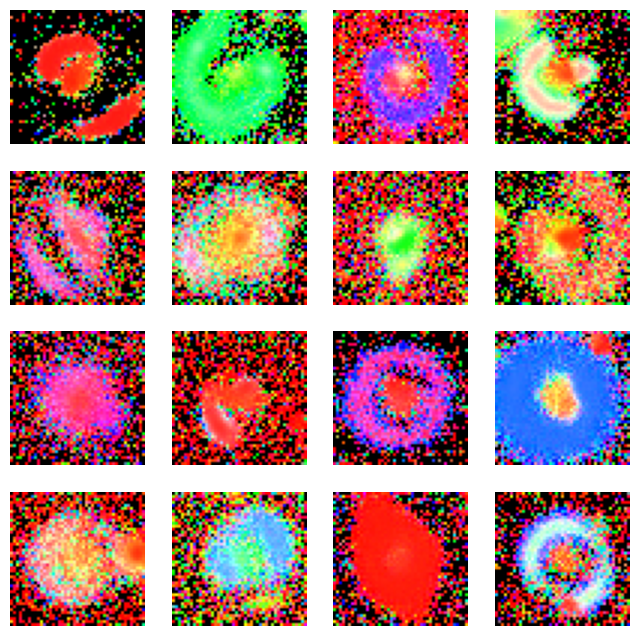

In [4]:
# Visualize target data
visualize_data(target_data)

from matplotlib.colors import PowerNorm

plt.imshow(source_data[212, 0, :, :], norm = PowerNorm(0.5), cmap = 'inferno')
plt.colorbar()

plt.imshow(target_data[2990, 0, :, :], norm = PowerNorm(0.5), cmap = 'inferno')
plt.colorbar()

source_metatab = pd.read_csv(source_meta)
target_metatab = pd.read_csv(target_meta)

source_metatab.iloc[86, 30:60]

b = 10#np.linspace(0, 1, 20)
plt.hist(source_metatab['PLANE_2-OBJECT_1-MASS_PROFILE_1-sigma_v-g'], bins = b)
plt.hist(target_metatab['PLANE_2-OBJECT_1-MASS_PROFILE_1-sigma_v-g'], bins = b, alpha = 0.5)

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import lognorm

# Parameters for the lognormal distribution
shape = 1.6  # Shape parameter (sigma)
scale = np.exp(0)  # Scale parameter (exp(mu))
size = 10000  # Number of samples

# Generate random samples from the lognormal distribution
samples = lognorm.rvs(s=shape, scale=scale, size=size)

# Plot the histogram of the samples
plt.hist(samples, bins=50, density=True, alpha=0.6, color='g')

# Plot the theoretical lognormal distribution
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = lognorm.pdf(x, s=shape, scale=scale)
plt.plot(x, p, 'k', linewidth=2)

title = f"Fit results: shape = {shape}, scale = {scale}"
plt.title(title)

plt.show()

In [5]:
model = NeuralNetwork(npix=45).cuda()
learning_rate = 1e-5
epochs = 100
# Define loss functions and optimizer
regressor_loss_fn = nn.MSELoss().cuda()

# Try to adjust momentum -> see if that helps
# Try SGD, Adadelta, see if that helps
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
da_loss = MMD_loss()

source_labels = pd.read_csv(source_meta)['PLANE_1-OBJECT_1-MASS_PROFILE_1-theta_E-g'].tolist()[:1000]
target_labels = pd.read_csv(target_meta)['PLANE_1-OBJECT_1-MASS_PROFILE_1-theta_E-g'].tolist()[:1000]

In [6]:
mod_name = None#"models/mb_lenscolor_jul25_1700" #
stats = {'train_DA_loss':[],
             'train_regression_loss':[],
             'train_r2_score':[],
             'val_source_regression_loss':[],
             'val_target_regression_loss':[],
             'val_source_r2_score':[],
             'val_target_r2_score':[],
            'epoch_no': 0}
if mod_name is not None:
    state = torch.load(mod_name)
    model.load_state_dict(state['state_dict'])
    optimizer.load_state_dict(state['optimizer'])
    
    stat_file = Path(mod_name+'.json')
    if stat_file.is_file():
        stats = json.load(open(mod_name+'.json', 'r'))

Beginning Training...
Generating Isomap...


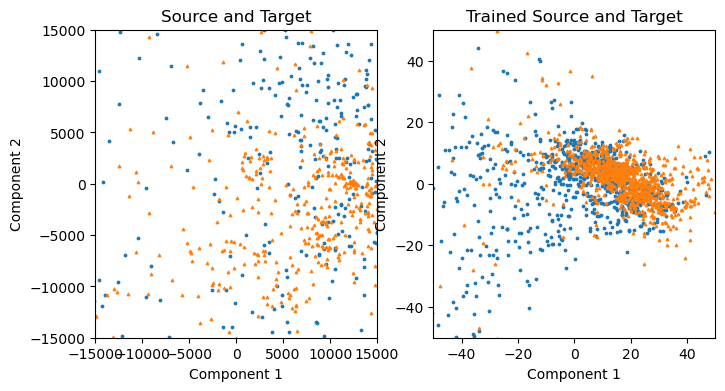

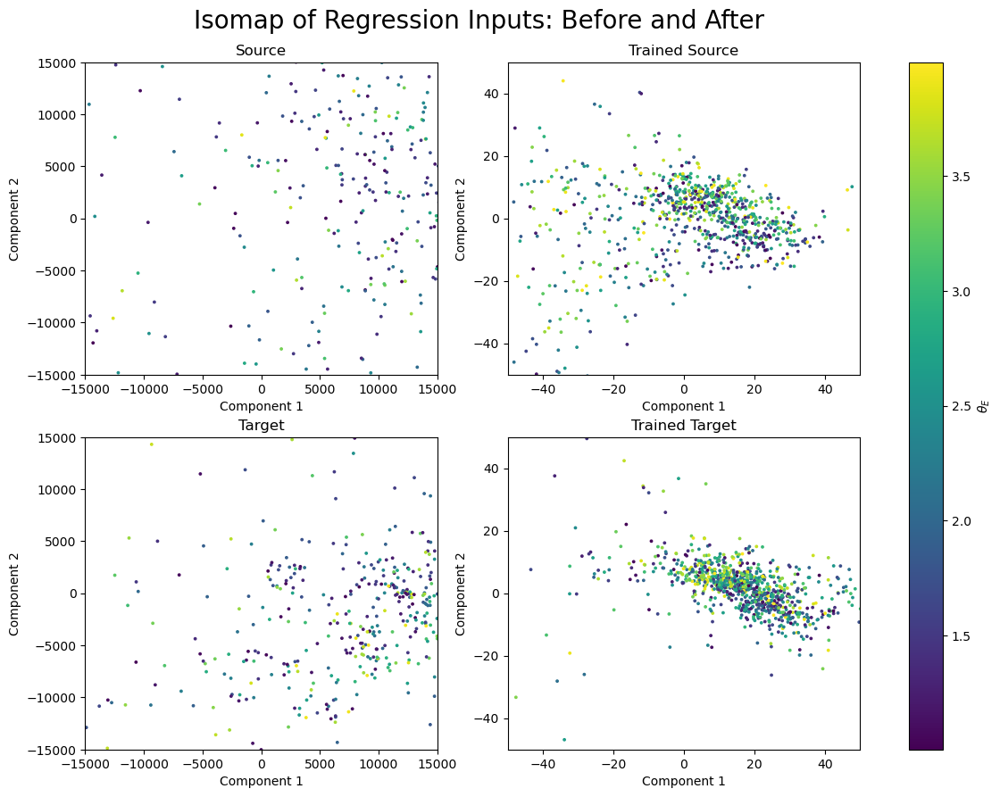


Epoch 0: 31.12s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2338
	Train Regression Loss: : 0.8984
	Train R2 Score: : -0.2680
 Validation Statistics:
	Val Source Regression Loss: : 0.3852
	Val Target Regression Loss: : 1.0389
	Val Source R2 Score: : 0.4611
	Val Target R2 Score: : -0.4399

Epoch 1: 30.21s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2284
	Train Regression Loss: : 0.3257
	Train R2 Score: : 0.5421
 Validation Statistics:
	Val Source Regression Loss: : 0.2688
	Val Target Regression Loss: : 0.6800
	Val Source R2 Score: : 0.6227
	Val Target R2 Score: : 0.0647

Epoch 2: 29.90s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2246
	Train Regression Loss: : 0.2401
	Train R2 Score: : 0.6620
 Validation Statistics:
	Val Source Regression Loss: : 0.2179
	Val Target Regression Loss: : 0.5480
	Val Source R2 Score: : 0.6939
	Val Target R2 Score: : 0.2496

Epoch 3: 30.19s
------------------------------

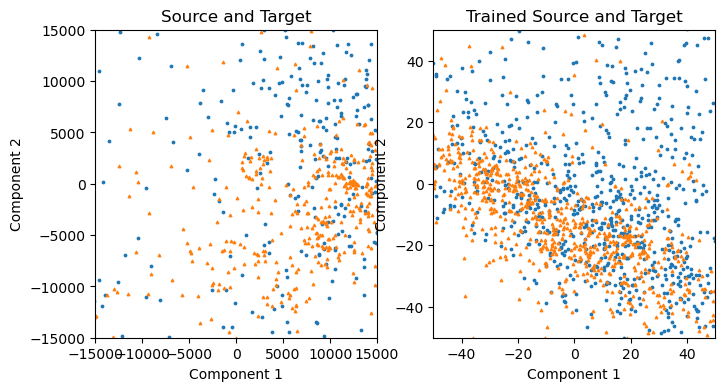

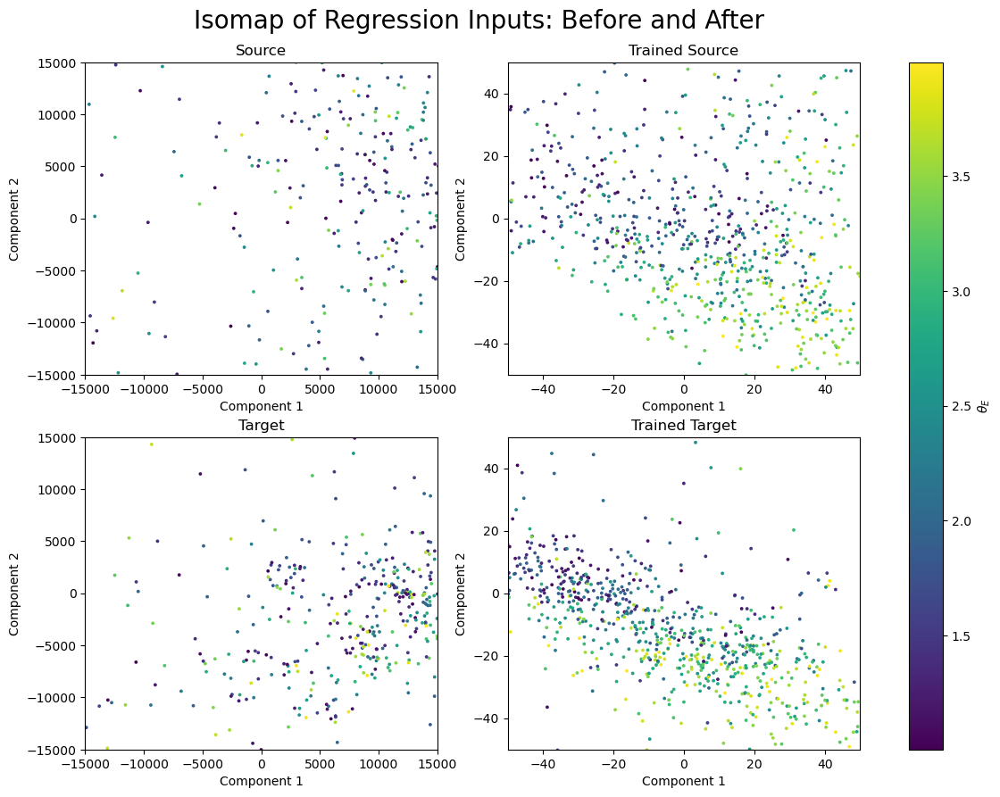

Saving Model... Done.

Epoch 5: 24.19s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2197
	Train Regression Loss: : 0.1385
	Train R2 Score: : 0.8040
 Validation Statistics:
	Val Source Regression Loss: : 0.1305
	Val Target Regression Loss: : 0.4017
	Val Source R2 Score: : 0.8165
	Val Target R2 Score: : 0.4444

Epoch 6: 24.24s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2215
	Train Regression Loss: : 0.1238
	Train R2 Score: : 0.8251
 Validation Statistics:
	Val Source Regression Loss: : 0.1204
	Val Target Regression Loss: : 0.3867
	Val Source R2 Score: : 0.8315
	Val Target R2 Score: : 0.4662

Epoch 7: 29.31s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2217
	Train Regression Loss: : 0.1108
	Train R2 Score: : 0.8435
 Validation Statistics:
	Val Source Regression Loss: : 0.1077
	Val Target Regression Loss: : 0.3572
	Val Source R2 Score: : 0.8494
	Val Target R2 Score: : 0.5002

Epoch 8: 27.44s
----------

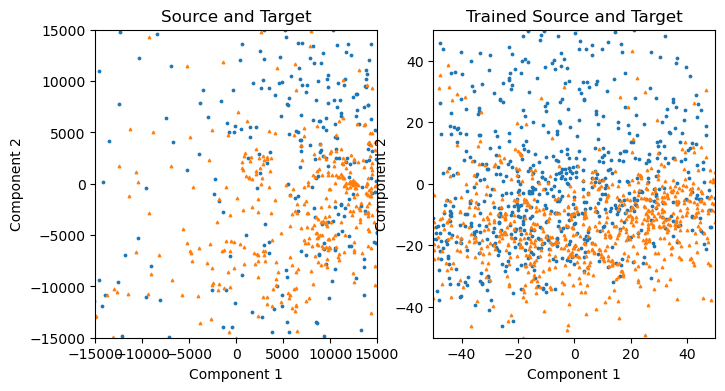

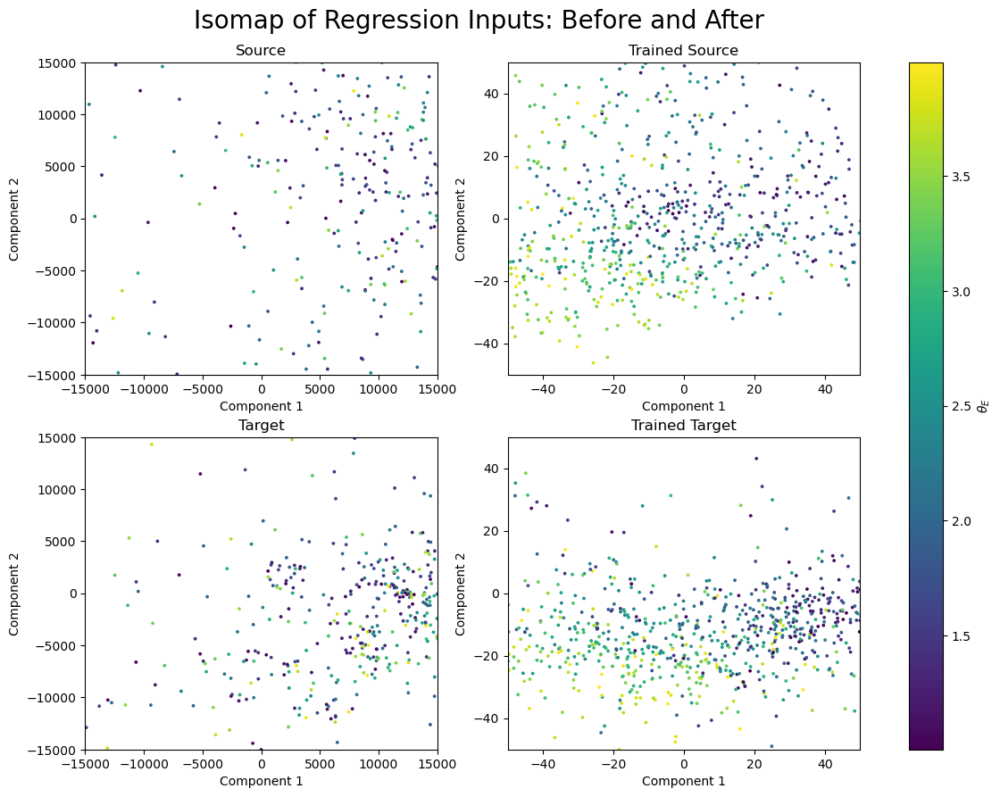

Saving Model... Done.

Epoch 10: 29.60s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2215
	Train Regression Loss: : 0.0847
	Train R2 Score: : 0.8805
 Validation Statistics:
	Val Source Regression Loss: : 0.0839
	Val Target Regression Loss: : 0.3400
	Val Source R2 Score: : 0.8821
	Val Target R2 Score: : 0.5254

Epoch 11: 29.07s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2225
	Train Regression Loss: : 0.0795
	Train R2 Score: : 0.8873
 Validation Statistics:
	Val Source Regression Loss: : 0.0786
	Val Target Regression Loss: : 0.3264
	Val Source R2 Score: : 0.8895
	Val Target R2 Score: : 0.5481

Epoch 12: 29.92s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2239
	Train Regression Loss: : 0.0747
	Train R2 Score: : 0.8941
 Validation Statistics:
	Val Source Regression Loss: : 0.0782
	Val Target Regression Loss: : 0.3357
	Val Source R2 Score: : 0.8902
	Val Target R2 Score: : 0.5348

Epoch 13: 29.65s
------

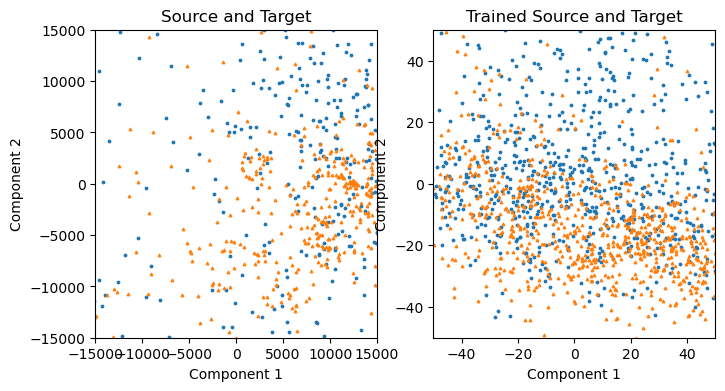

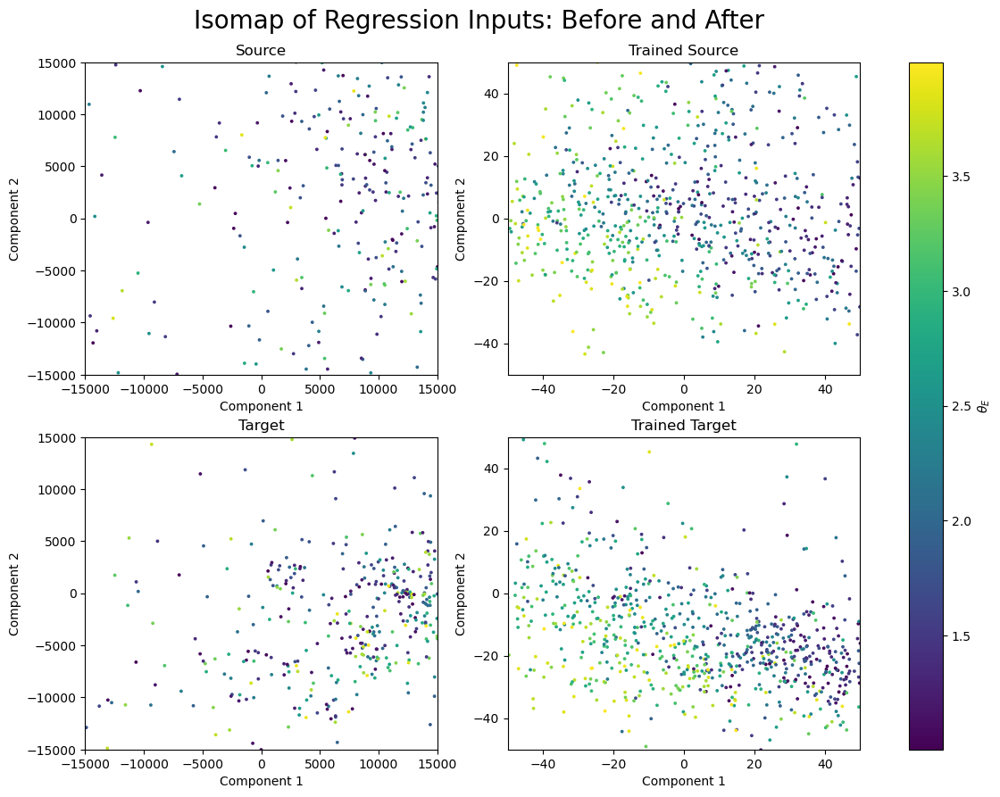

Saving Model... Done.

Epoch 15: 29.76s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2255
	Train Regression Loss: : 0.0631
	Train R2 Score: : 0.9106
 Validation Statistics:
	Val Source Regression Loss: : 0.0649
	Val Target Regression Loss: : 0.3184
	Val Source R2 Score: : 0.9085
	Val Target R2 Score: : 0.5604

Epoch 16: 28.30s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2265
	Train Regression Loss: : 0.0598
	Train R2 Score: : 0.9153
 Validation Statistics:
	Val Source Regression Loss: : 0.0627
	Val Target Regression Loss: : 0.3078
	Val Source R2 Score: : 0.9114
	Val Target R2 Score: : 0.5709

Epoch 17: 29.51s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2254
	Train Regression Loss: : 0.0574
	Train R2 Score: : 0.9188
 Validation Statistics:
	Val Source Regression Loss: : 0.0608
	Val Target Regression Loss: : 0.3126
	Val Source R2 Score: : 0.9148
	Val Target R2 Score: : 0.5628

Epoch 18: 30.91s
------

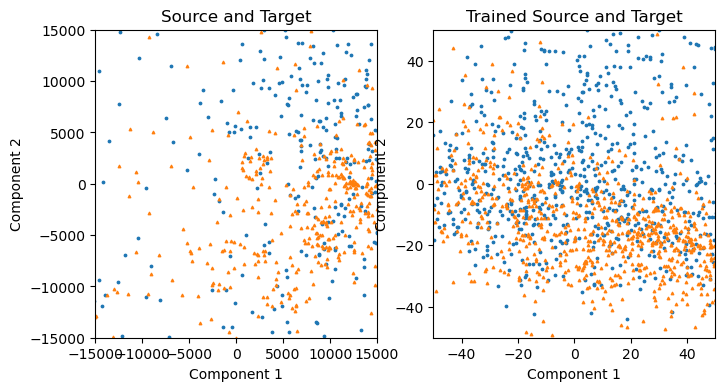

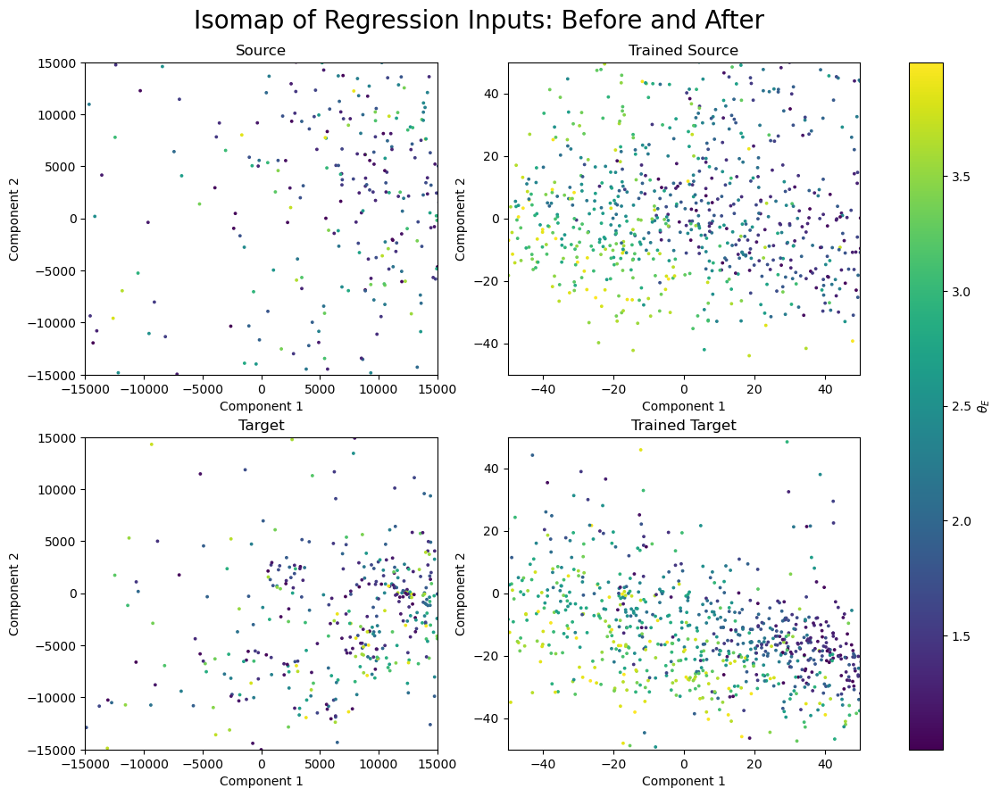

Saving Model... Done.

Epoch 20: 28.51s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2270
	Train Regression Loss: : 0.0515
	Train R2 Score: : 0.9270
 Validation Statistics:
	Val Source Regression Loss: : 0.0554
	Val Target Regression Loss: : 0.2970
	Val Source R2 Score: : 0.9219
	Val Target R2 Score: : 0.5917

Epoch 21: 29.15s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2272
	Train Regression Loss: : 0.0502
	Train R2 Score: : 0.9290
 Validation Statistics:
	Val Source Regression Loss: : 0.0526
	Val Target Regression Loss: : 0.2906
	Val Source R2 Score: : 0.9253
	Val Target R2 Score: : 0.5998

Epoch 22: 23.47s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2277
	Train Regression Loss: : 0.0484
	Train R2 Score: : 0.9317
 Validation Statistics:
	Val Source Regression Loss: : 0.0532
	Val Target Regression Loss: : 0.2998
	Val Source R2 Score: : 0.9254
	Val Target R2 Score: : 0.5905

Epoch 23: 22.59s
------

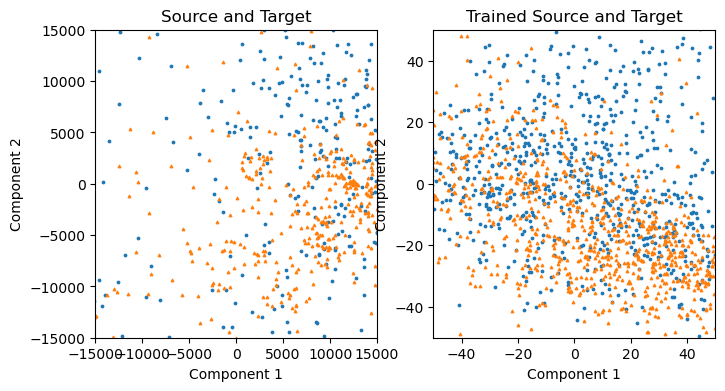

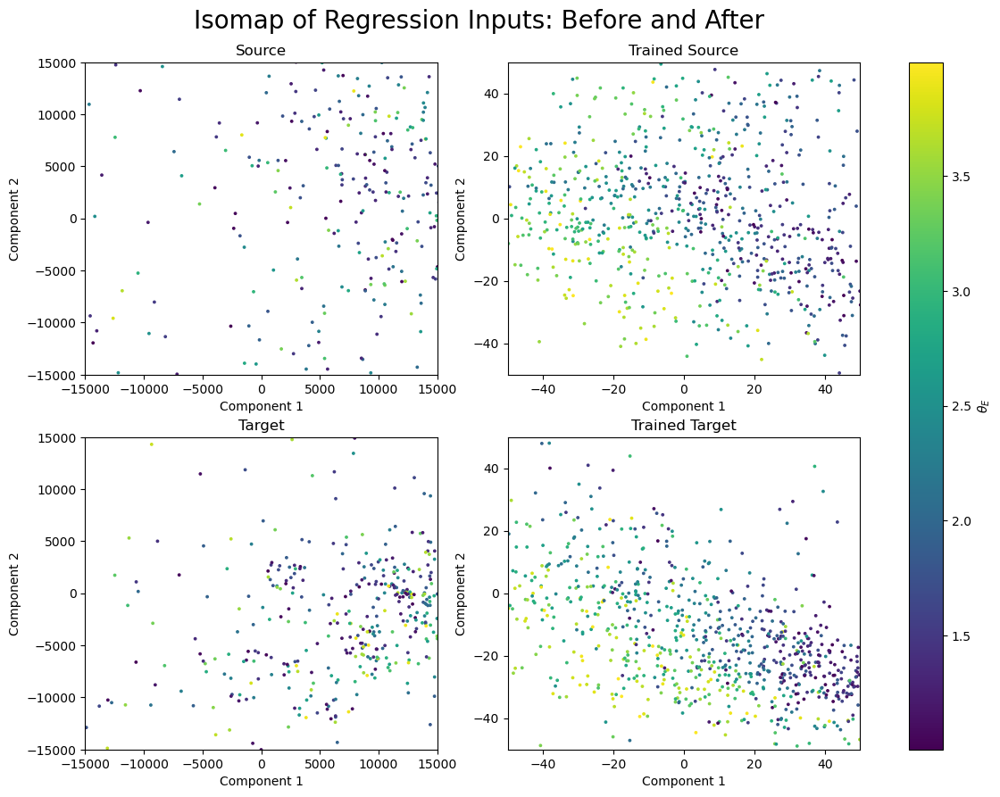

Saving Model... Done.

Epoch 25: 21.73s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2285
	Train Regression Loss: : 0.0445
	Train R2 Score: : 0.9369
 Validation Statistics:
	Val Source Regression Loss: : 0.0483
	Val Target Regression Loss: : 0.2854
	Val Source R2 Score: : 0.9321
	Val Target R2 Score: : 0.6025

Epoch 26: 21.78s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2292
	Train Regression Loss: : 0.0436
	Train R2 Score: : 0.9382
 Validation Statistics:
	Val Source Regression Loss: : 0.0472
	Val Target Regression Loss: : 0.2906
	Val Source R2 Score: : 0.9333
	Val Target R2 Score: : 0.5990

Epoch 27: 22.49s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2284
	Train Regression Loss: : 0.0421
	Train R2 Score: : 0.9402
 Validation Statistics:
	Val Source Regression Loss: : 0.0455
	Val Target Regression Loss: : 0.2877
	Val Source R2 Score: : 0.9346
	Val Target R2 Score: : 0.6004

Epoch 28: 21.58s
------

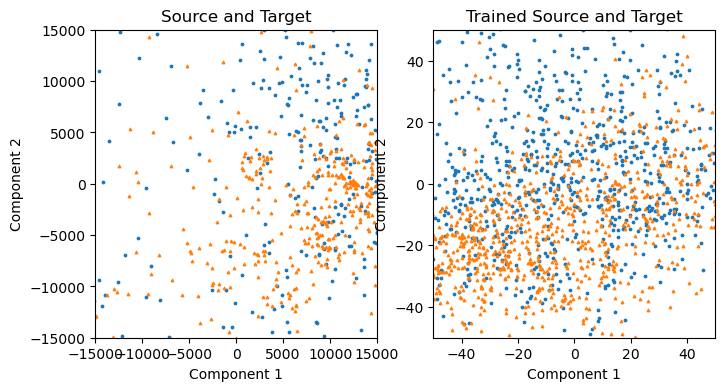

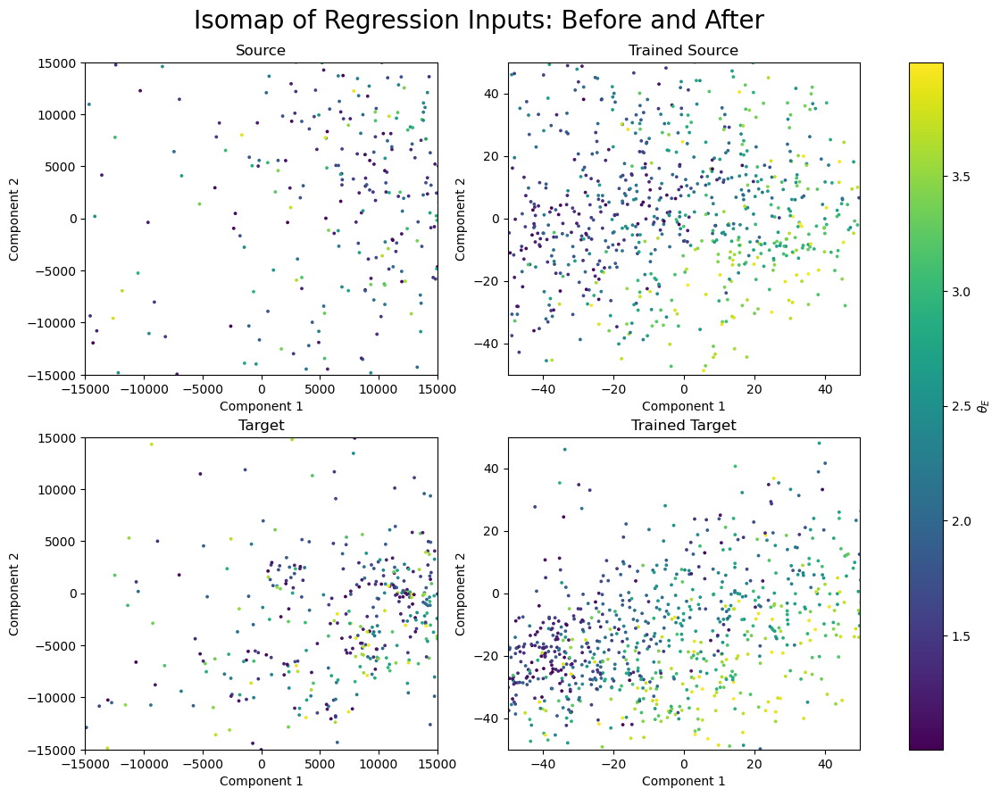

Saving Model... Done.

Epoch 30: 24.20s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2263
	Train Regression Loss: : 0.0398
	Train R2 Score: : 0.9438
 Validation Statistics:
	Val Source Regression Loss: : 0.0440
	Val Target Regression Loss: : 0.2826
	Val Source R2 Score: : 0.9384
	Val Target R2 Score: : 0.6088

Epoch 31: 24.19s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2284
	Train Regression Loss: : 0.0392
	Train R2 Score: : 0.9445
 Validation Statistics:
	Val Source Regression Loss: : 0.0430
	Val Target Regression Loss: : 0.2826
	Val Source R2 Score: : 0.9388
	Val Target R2 Score: : 0.6102

Epoch 32: 25.43s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2272
	Train Regression Loss: : 0.0383
	Train R2 Score: : 0.9456
 Validation Statistics:
	Val Source Regression Loss: : 0.0425
	Val Target Regression Loss: : 0.2757
	Val Source R2 Score: : 0.9398
	Val Target R2 Score: : 0.6194

Epoch 33: 30.92s
------

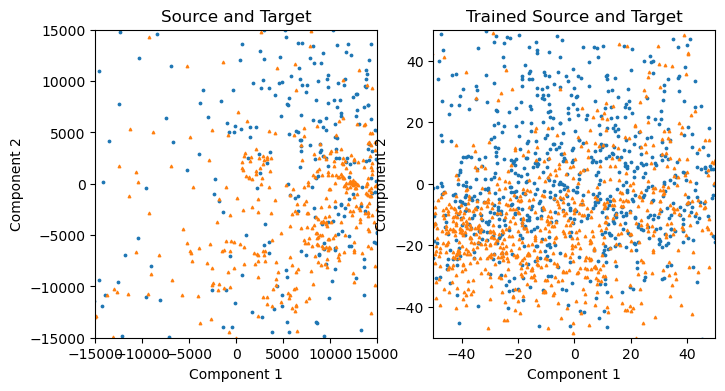

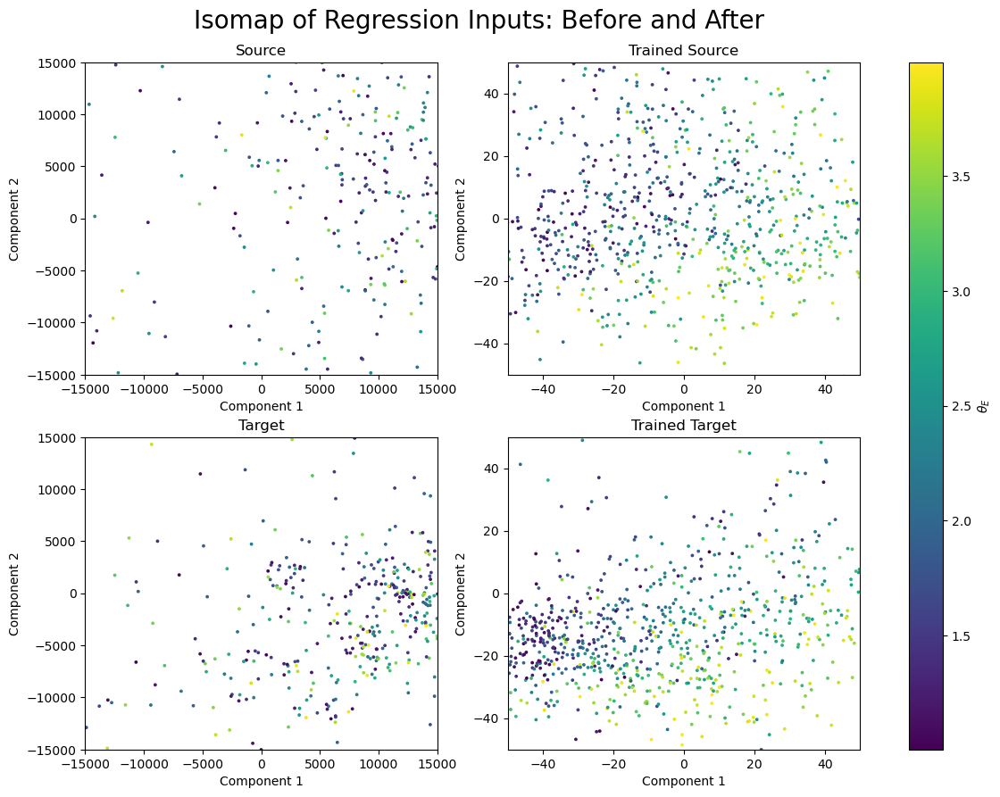

Saving Model... Done.

Epoch 35: 29.35s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2276
	Train Regression Loss: : 0.0367
	Train R2 Score: : 0.9478
 Validation Statistics:
	Val Source Regression Loss: : 0.0405
	Val Target Regression Loss: : 0.2764
	Val Source R2 Score: : 0.9430
	Val Target R2 Score: : 0.6161

Epoch 36: 28.42s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2270
	Train Regression Loss: : 0.0357
	Train R2 Score: : 0.9494
 Validation Statistics:
	Val Source Regression Loss: : 0.0394
	Val Target Regression Loss: : 0.2799
	Val Source R2 Score: : 0.9446
	Val Target R2 Score: : 0.6106

Epoch 37: 27.40s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2267
	Train Regression Loss: : 0.0353
	Train R2 Score: : 0.9502
 Validation Statistics:
	Val Source Regression Loss: : 0.0392
	Val Target Regression Loss: : 0.2711
	Val Source R2 Score: : 0.9445
	Val Target R2 Score: : 0.6293

Epoch 38: 29.59s
------

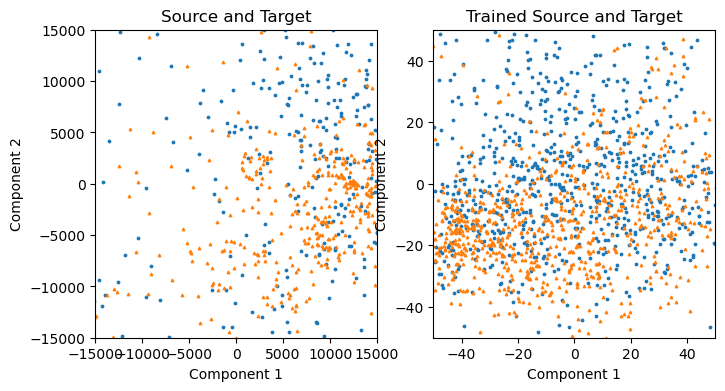

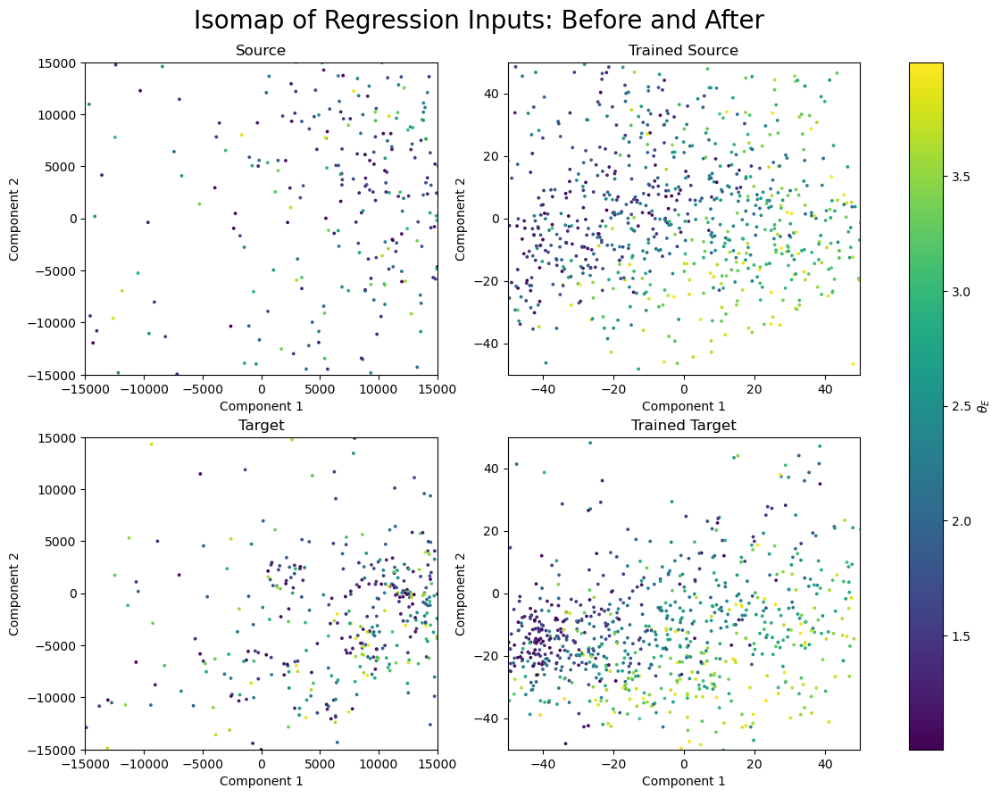

Saving Model... Done.

Epoch 40: 30.06s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2263
	Train Regression Loss: : 0.0337
	Train R2 Score: : 0.9522
 Validation Statistics:
	Val Source Regression Loss: : 0.0378
	Val Target Regression Loss: : 0.2765
	Val Source R2 Score: : 0.9468
	Val Target R2 Score: : 0.6178

Epoch 41: 30.03s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2283
	Train Regression Loss: : 0.0334
	Train R2 Score: : 0.9525
 Validation Statistics:
	Val Source Regression Loss: : 0.0370
	Val Target Regression Loss: : 0.2749
	Val Source R2 Score: : 0.9476
	Val Target R2 Score: : 0.6196

Epoch 42: 31.19s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2272
	Train Regression Loss: : 0.0330
	Train R2 Score: : 0.9533
 Validation Statistics:
	Val Source Regression Loss: : 0.0376
	Val Target Regression Loss: : 0.2761
	Val Source R2 Score: : 0.9474
	Val Target R2 Score: : 0.6183

Epoch 43: 29.02s
------

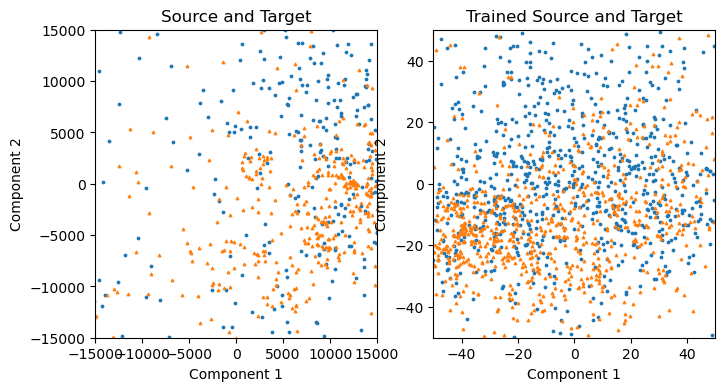

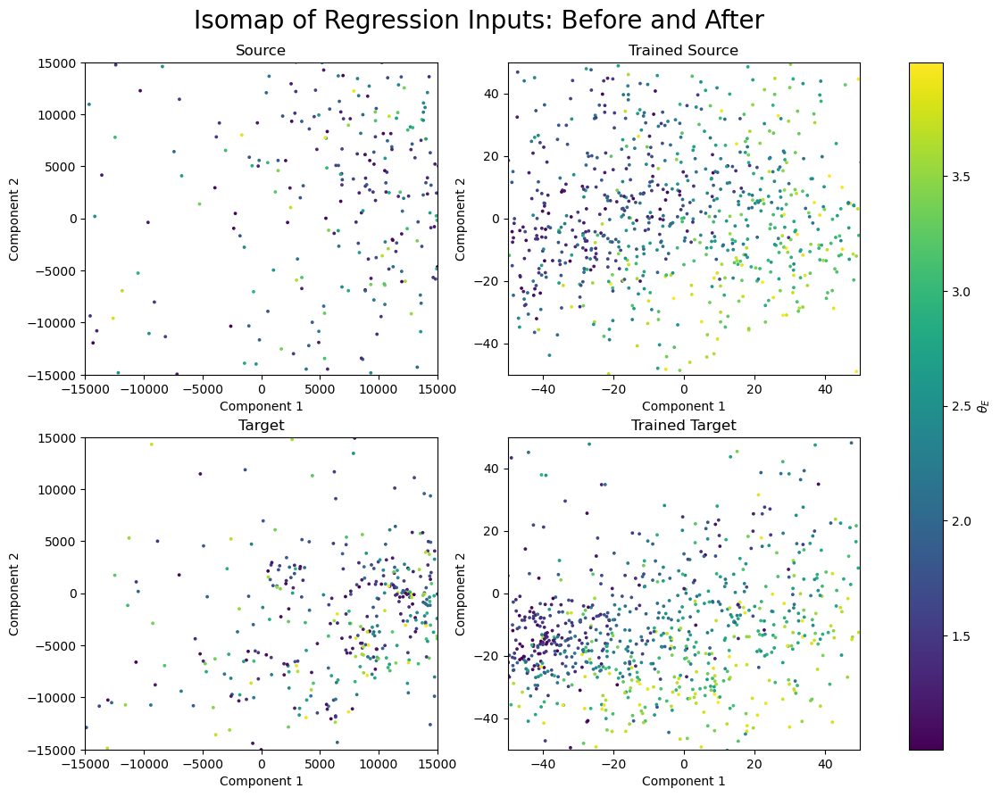

Saving Model... Done.

Epoch 45: 28.39s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2277
	Train Regression Loss: : 0.0318
	Train R2 Score: : 0.9550
 Validation Statistics:
	Val Source Regression Loss: : 0.0358
	Val Target Regression Loss: : 0.2804
	Val Source R2 Score: : 0.9494
	Val Target R2 Score: : 0.6091

Epoch 46: 28.23s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2275
	Train Regression Loss: : 0.0316
	Train R2 Score: : 0.9551
 Validation Statistics:
	Val Source Regression Loss: : 0.0350
	Val Target Regression Loss: : 0.2734
	Val Source R2 Score: : 0.9498
	Val Target R2 Score: : 0.6228

Epoch 47: 28.14s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2276
	Train Regression Loss: : 0.0309
	Train R2 Score: : 0.9561
 Validation Statistics:
	Val Source Regression Loss: : 0.0354
	Val Target Regression Loss: : 0.2713
	Val Source R2 Score: : 0.9492
	Val Target R2 Score: : 0.6226

Epoch 48: 28.94s
------

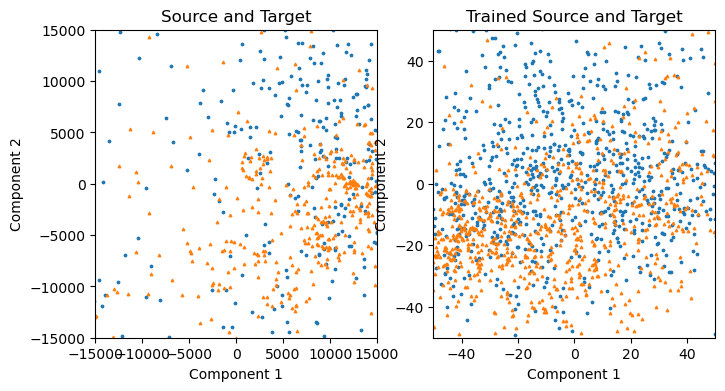

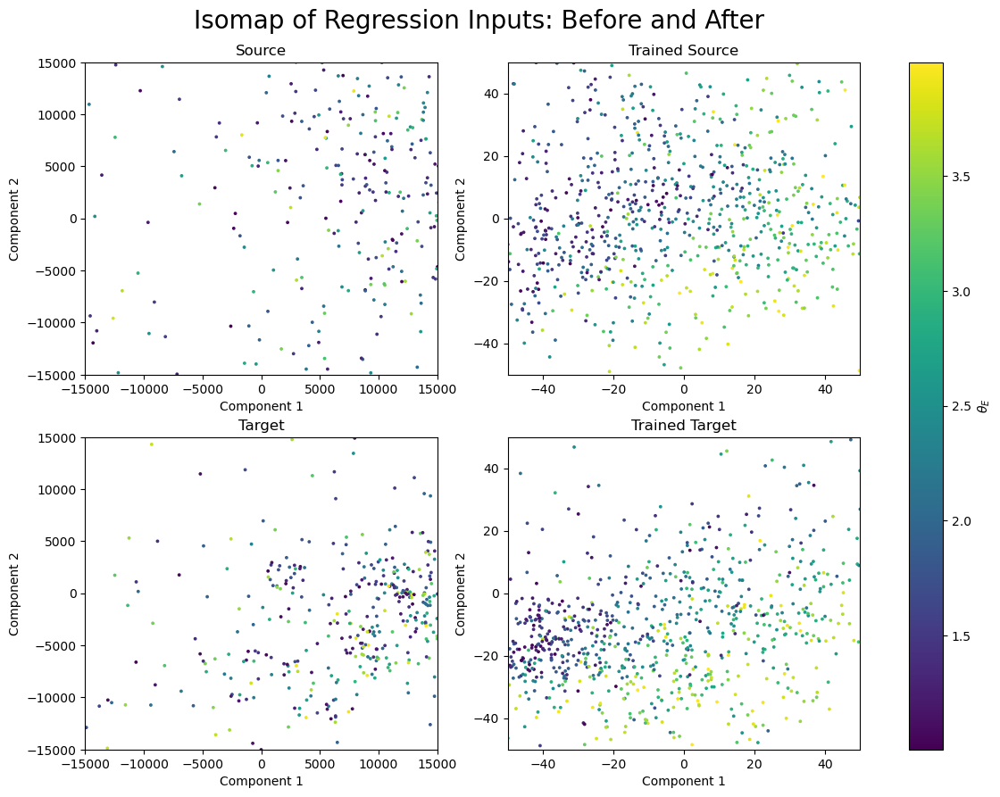


Epoch 50: 27.88s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2273
	Train Regression Loss: : 0.0300
	Train R2 Score: : 0.9577
 Validation Statistics:
	Val Source Regression Loss: : 0.0343
	Val Target Regression Loss: : 0.2739
	Val Source R2 Score: : 0.9515
	Val Target R2 Score: : 0.6214

Epoch 51: 27.84s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2265
	Train Regression Loss: : 0.0297
	Train R2 Score: : 0.9579
 Validation Statistics:
	Val Source Regression Loss: : 0.0355
	Val Target Regression Loss: : 0.2725
	Val Source R2 Score: : 0.9505
	Val Target R2 Score: : 0.6201

Epoch 52: 27.58s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2270
	Train Regression Loss: : 0.0293
	Train R2 Score: : 0.9584
 Validation Statistics:
	Val Source Regression Loss: : 0.0339
	Val Target Regression Loss: : 0.2734
	Val Source R2 Score: : 0.9525
	Val Target R2 Score: : 0.6240

Epoch 53: 28.94s
----------------------------

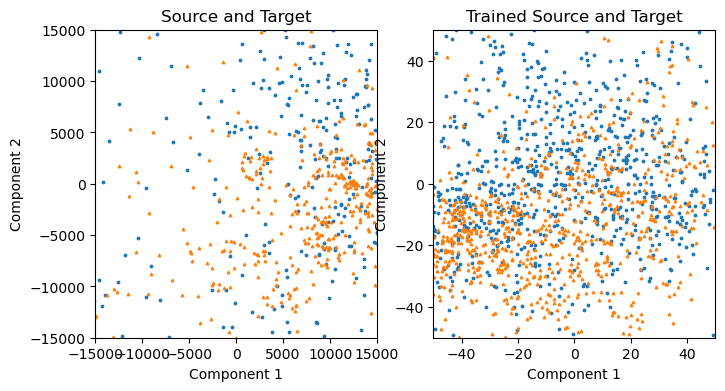

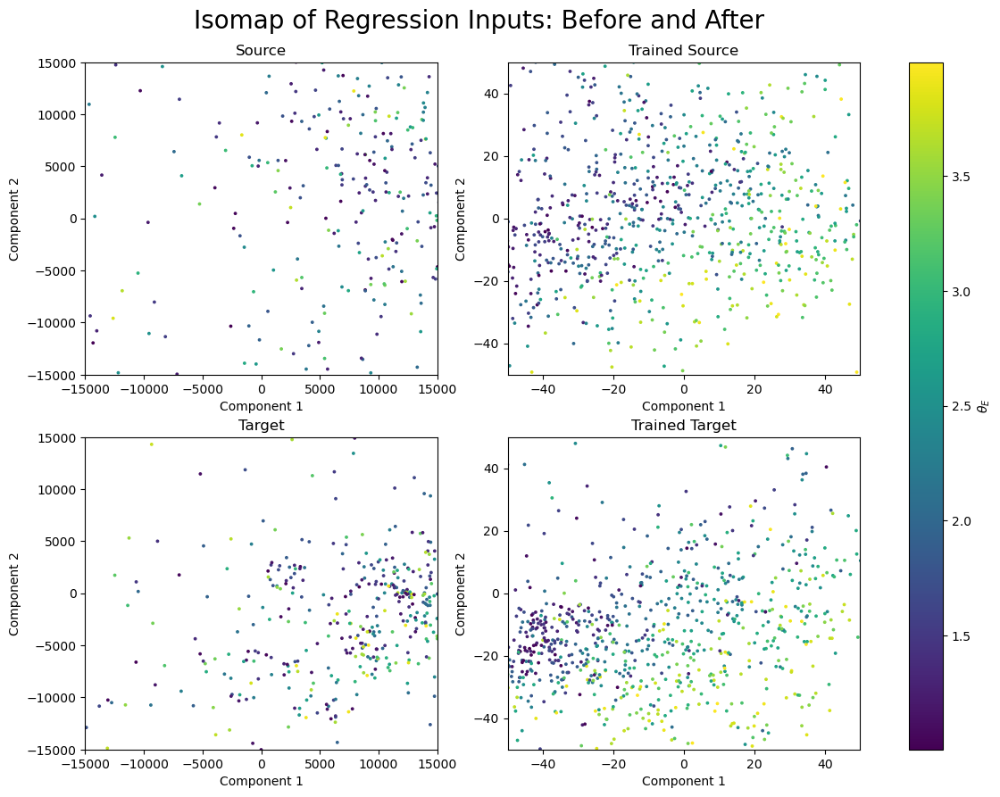


Epoch 55: 28.36s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2275
	Train Regression Loss: : 0.0283
	Train R2 Score: : 0.9599
 Validation Statistics:
	Val Source Regression Loss: : 0.0339
	Val Target Regression Loss: : 0.2858
	Val Source R2 Score: : 0.9526
	Val Target R2 Score: : 0.6056

Epoch 56: 24.97s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2280
	Train Regression Loss: : 0.0281
	Train R2 Score: : 0.9602
 Validation Statistics:
	Val Source Regression Loss: : 0.0322
	Val Target Regression Loss: : 0.2677
	Val Source R2 Score: : 0.9552
	Val Target R2 Score: : 0.6302

Epoch 57: 24.61s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2279
	Train Regression Loss: : 0.0280
	Train R2 Score: : 0.9604
 Validation Statistics:
	Val Source Regression Loss: : 0.0322
	Val Target Regression Loss: : 0.2716
	Val Source R2 Score: : 0.9540
	Val Target R2 Score: : 0.6207

Epoch 58: 23.33s
----------------------------

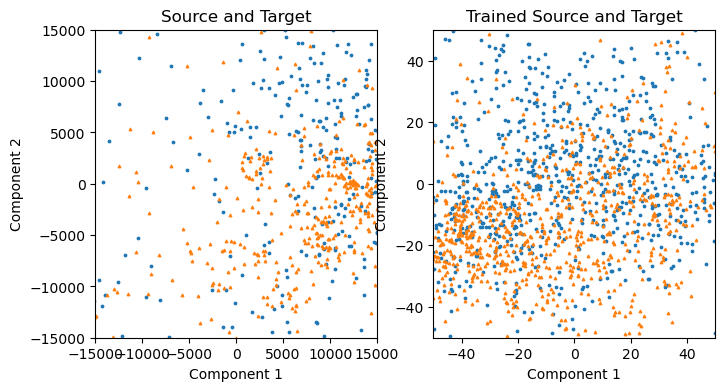

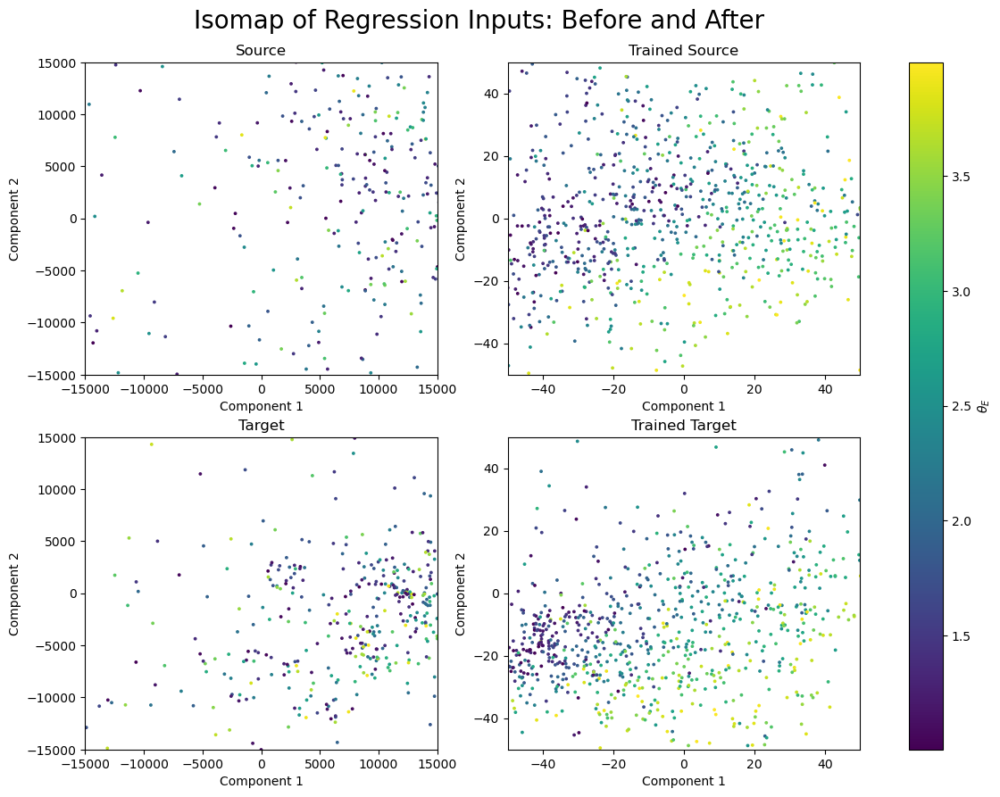


Epoch 60: 26.07s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2278
	Train Regression Loss: : 0.0272
	Train R2 Score: : 0.9613
 Validation Statistics:
	Val Source Regression Loss: : 0.0315
	Val Target Regression Loss: : 0.2779
	Val Source R2 Score: : 0.9555
	Val Target R2 Score: : 0.6198

Epoch 61: 22.23s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2281
	Train Regression Loss: : 0.0269
	Train R2 Score: : 0.9616
 Validation Statistics:
	Val Source Regression Loss: : 0.0323
	Val Target Regression Loss: : 0.2735
	Val Source R2 Score: : 0.9548
	Val Target R2 Score: : 0.6199

Epoch 62: 19.72s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2265
	Train Regression Loss: : 0.0266
	Train R2 Score: : 0.9621
 Validation Statistics:
	Val Source Regression Loss: : 0.0313
	Val Target Regression Loss: : 0.2719
	Val Source R2 Score: : 0.9559
	Val Target R2 Score: : 0.6250

Epoch 63: 20.67s
----------------------------

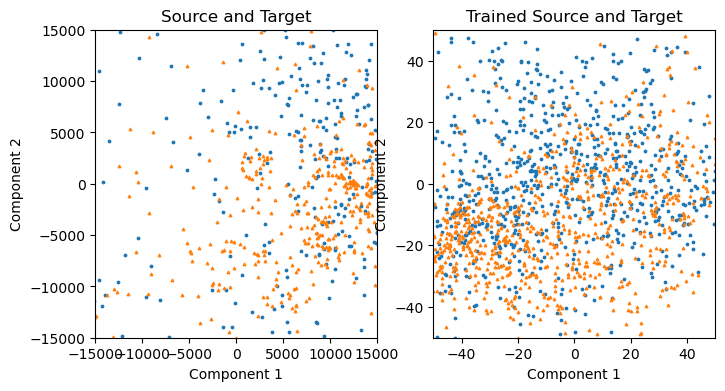

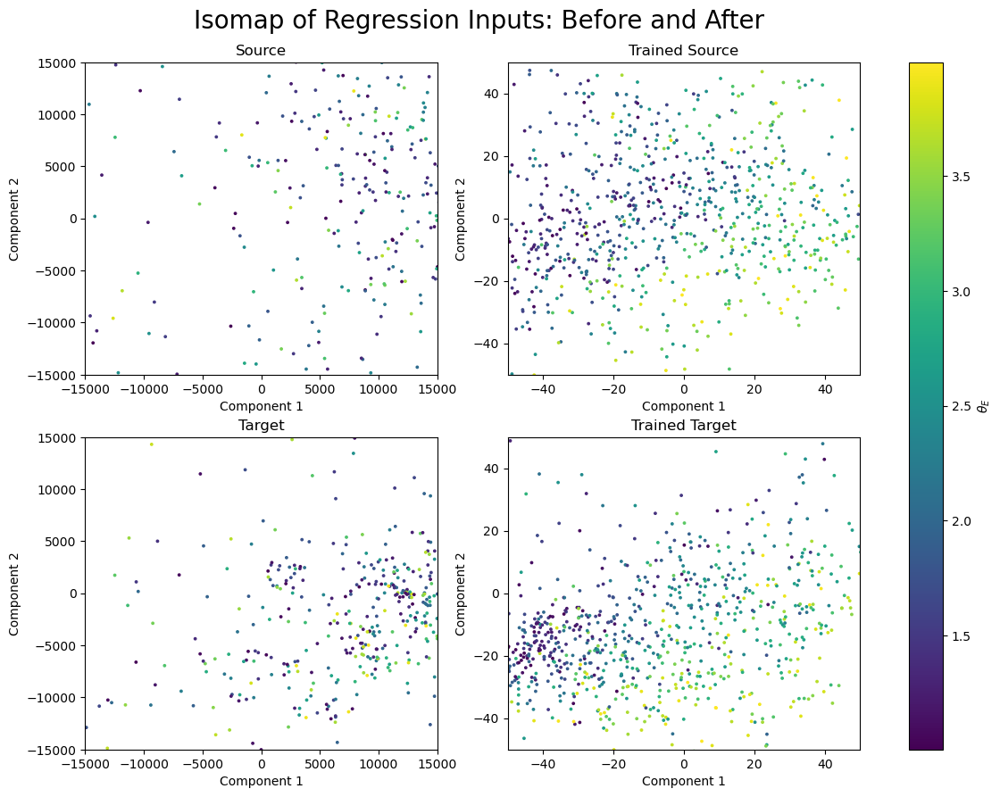


Epoch 65: 18.34s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2268
	Train Regression Loss: : 0.0260
	Train R2 Score: : 0.9631
 Validation Statistics:
	Val Source Regression Loss: : 0.0309
	Val Target Regression Loss: : 0.2716
	Val Source R2 Score: : 0.9564
	Val Target R2 Score: : 0.6202

Epoch 66: 18.75s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2273
	Train Regression Loss: : 0.0257
	Train R2 Score: : 0.9636
 Validation Statistics:
	Val Source Regression Loss: : 0.0306
	Val Target Regression Loss: : 0.2748
	Val Source R2 Score: : 0.9570
	Val Target R2 Score: : 0.6144

Epoch 67: 18.67s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2267
	Train Regression Loss: : 0.0256
	Train R2 Score: : 0.9635
 Validation Statistics:
	Val Source Regression Loss: : 0.0304
	Val Target Regression Loss: : 0.2810
	Val Source R2 Score: : 0.9577
	Val Target R2 Score: : 0.6094

Epoch 68: 18.59s
----------------------------

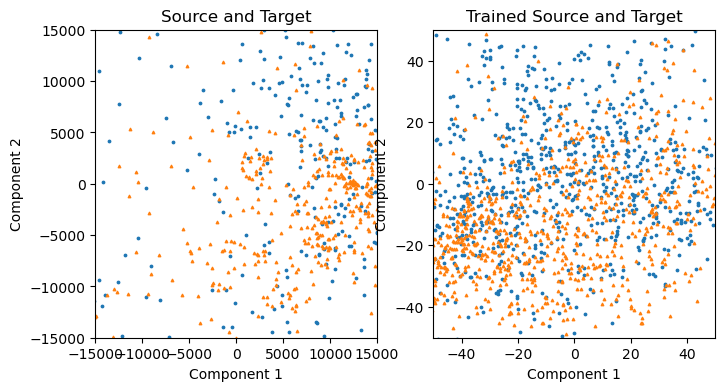

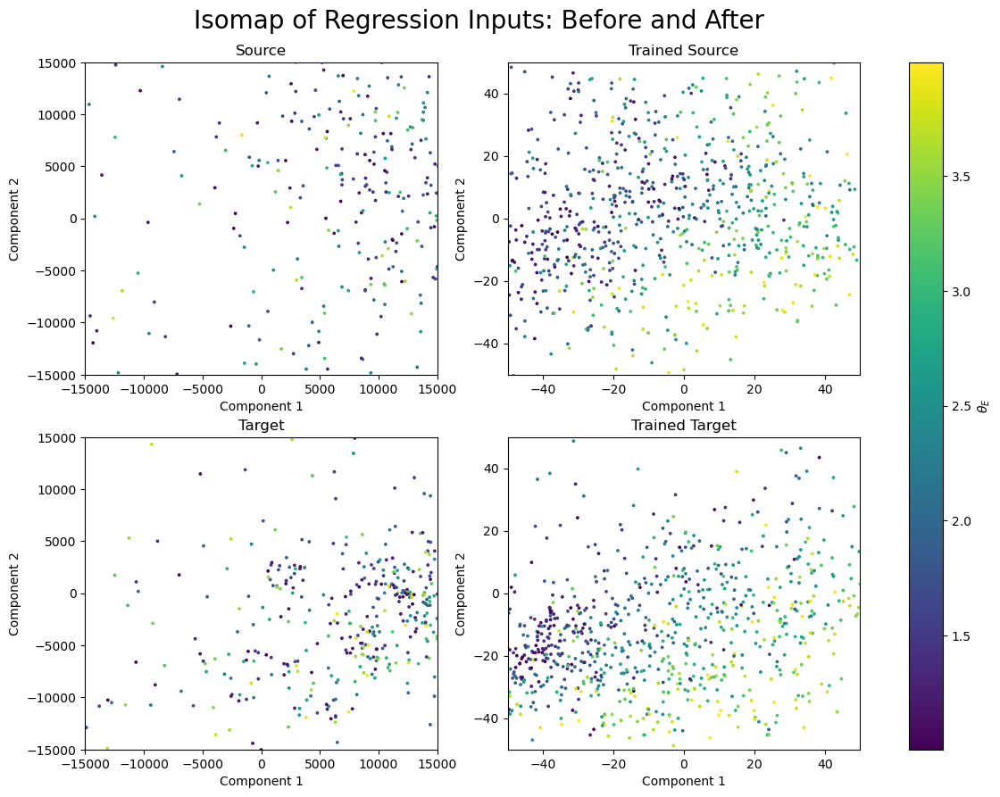


Epoch 70: 18.27s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2276
	Train Regression Loss: : 0.0252
	Train R2 Score: : 0.9642
 Validation Statistics:
	Val Source Regression Loss: : 0.0308
	Val Target Regression Loss: : 0.2755
	Val Source R2 Score: : 0.9572
	Val Target R2 Score: : 0.6153

Epoch 71: 18.74s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2272
	Train Regression Loss: : 0.0249
	Train R2 Score: : 0.9647
 Validation Statistics:
	Val Source Regression Loss: : 0.0303
	Val Target Regression Loss: : 0.2792
	Val Source R2 Score: : 0.9568
	Val Target R2 Score: : 0.6127

Epoch 72: 18.94s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2273
	Train Regression Loss: : 0.0247
	Train R2 Score: : 0.9648
 Validation Statistics:
	Val Source Regression Loss: : 0.0302
	Val Target Regression Loss: : 0.2778
	Val Source R2 Score: : 0.9574
	Val Target R2 Score: : 0.6170

Epoch 73: 19.69s
----------------------------

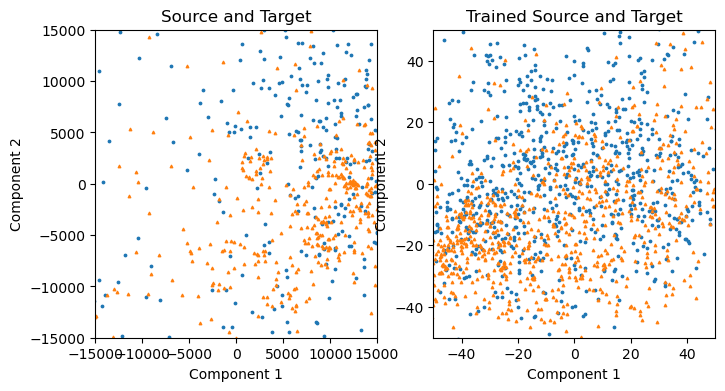

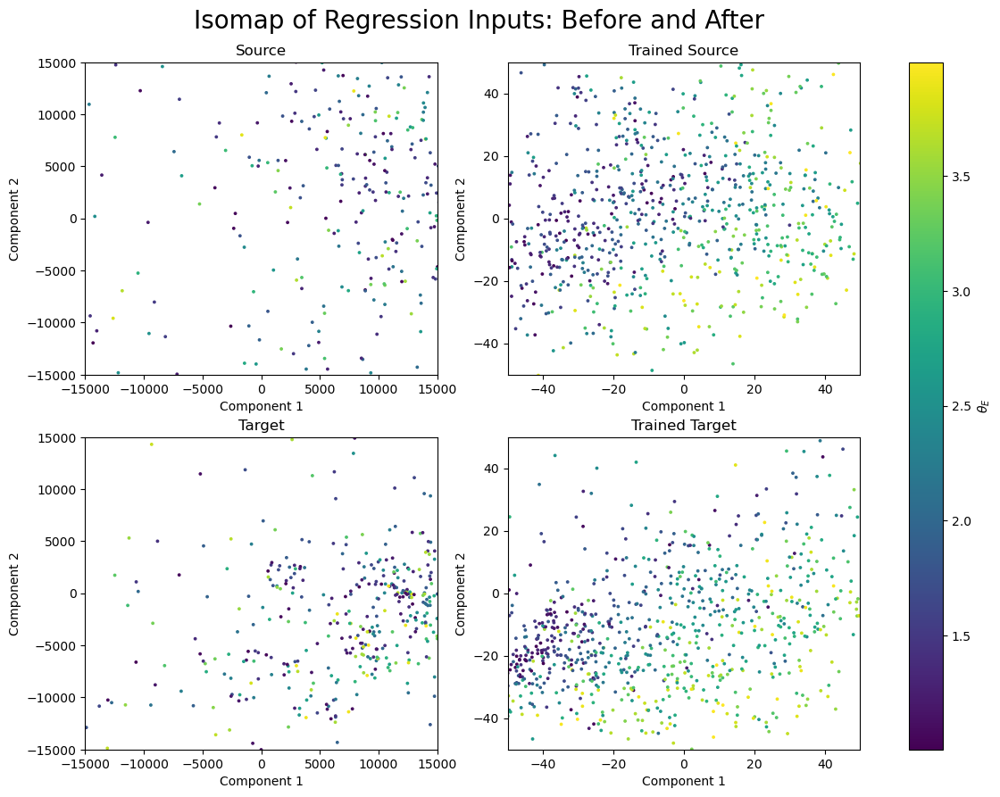


Epoch 75: 25.58s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2272
	Train Regression Loss: : 0.0243
	Train R2 Score: : 0.9655
 Validation Statistics:
	Val Source Regression Loss: : 0.0301
	Val Target Regression Loss: : 0.2754
	Val Source R2 Score: : 0.9577
	Val Target R2 Score: : 0.6190

Epoch 76: 20.93s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2262
	Train Regression Loss: : 0.0239
	Train R2 Score: : 0.9661
 Validation Statistics:
	Val Source Regression Loss: : 0.0290
	Val Target Regression Loss: : 0.2763
	Val Source R2 Score: : 0.9595
	Val Target R2 Score: : 0.6181

Epoch 77: 19.98s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2270
	Train Regression Loss: : 0.0240
	Train R2 Score: : 0.9659
 Validation Statistics:
	Val Source Regression Loss: : 0.0289
	Val Target Regression Loss: : 0.2729
	Val Source R2 Score: : 0.9597
	Val Target R2 Score: : 0.6230

Epoch 78: 21.88s
----------------------------

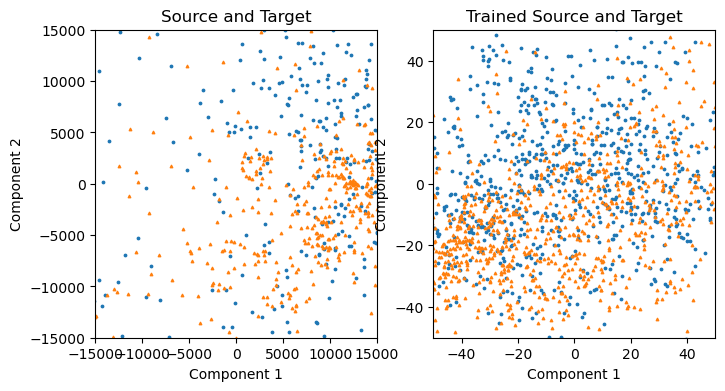

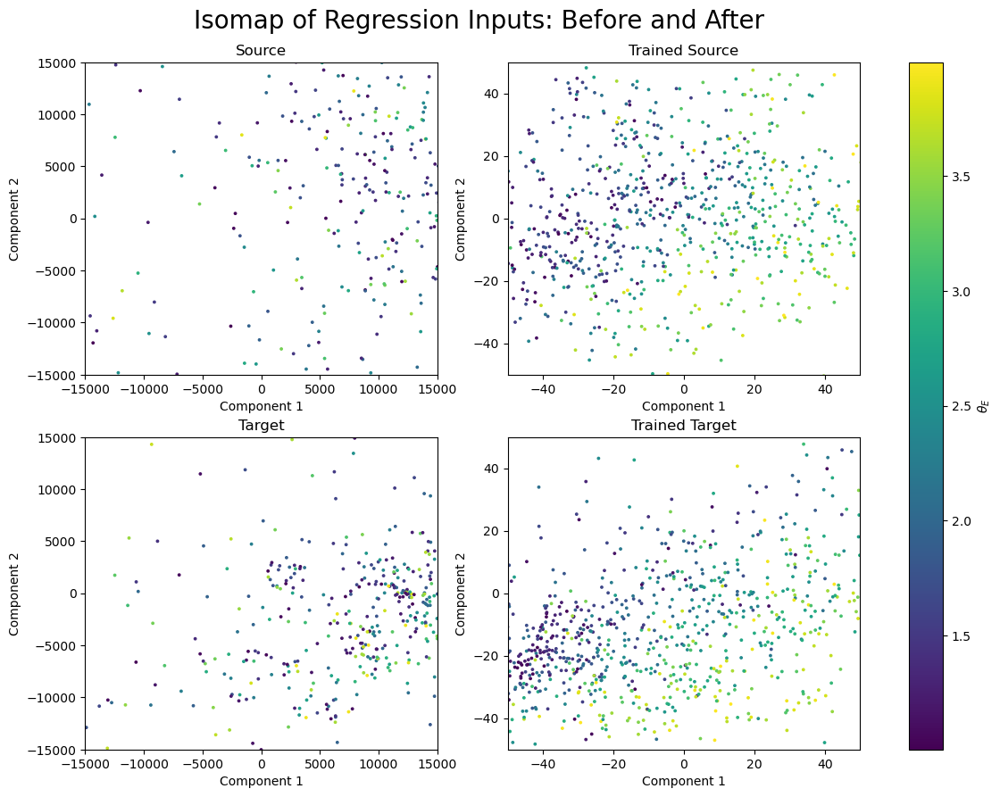


Epoch 80: 22.06s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2280
	Train Regression Loss: : 0.0233
	Train R2 Score: : 0.9671
 Validation Statistics:
	Val Source Regression Loss: : 0.0280
	Val Target Regression Loss: : 0.2808
	Val Source R2 Score: : 0.9607
	Val Target R2 Score: : 0.6128

Epoch 81: 22.27s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2269
	Train Regression Loss: : 0.0232
	Train R2 Score: : 0.9672
 Validation Statistics:
	Val Source Regression Loss: : 0.0279
	Val Target Regression Loss: : 0.2735
	Val Source R2 Score: : 0.9608
	Val Target R2 Score: : 0.6253

Epoch 82: 23.54s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2280
	Train Regression Loss: : 0.0230
	Train R2 Score: : 0.9674
 Validation Statistics:
	Val Source Regression Loss: : 0.0287
	Val Target Regression Loss: : 0.2814
	Val Source R2 Score: : 0.9593
	Val Target R2 Score: : 0.6103

Epoch 83: 23.40s
----------------------------

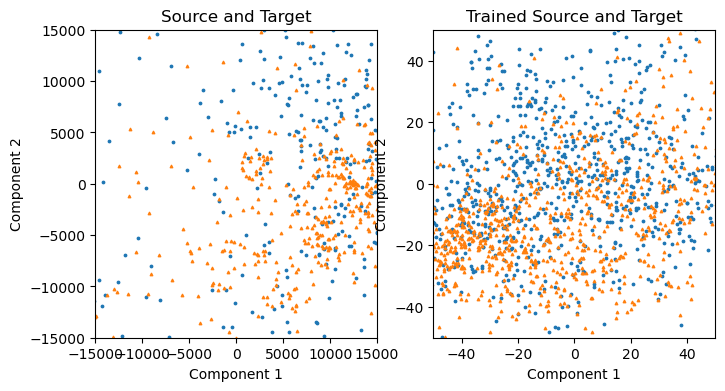

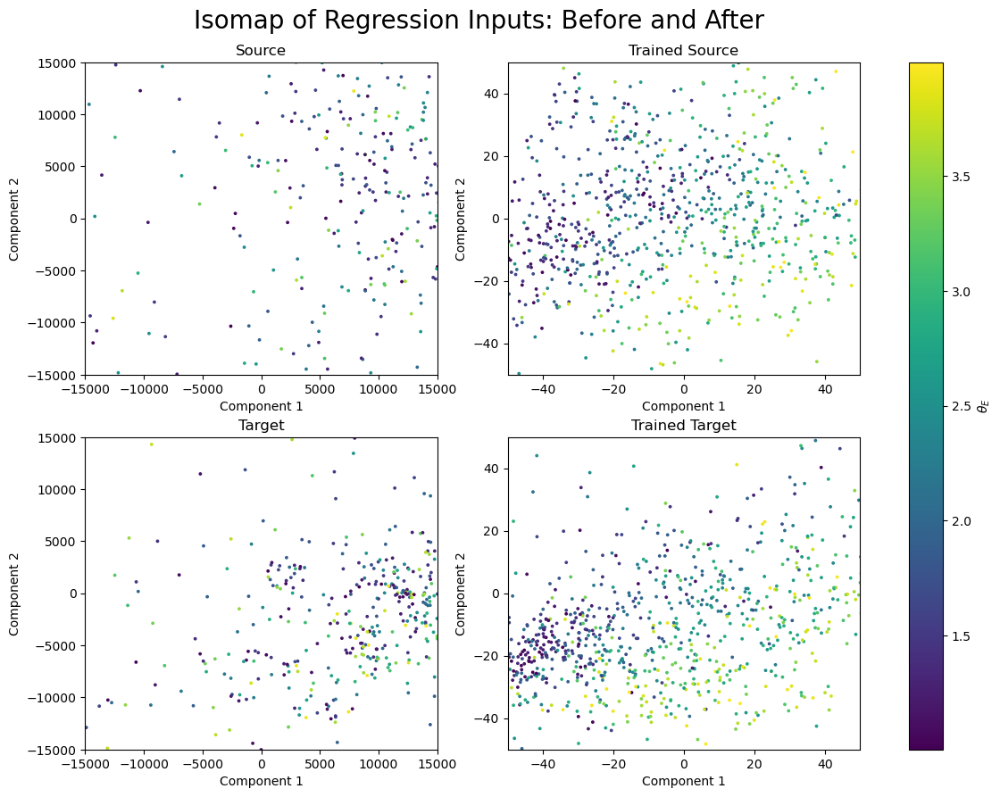


Epoch 85: 23.46s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2274
	Train Regression Loss: : 0.0226
	Train R2 Score: : 0.9678
 Validation Statistics:
	Val Source Regression Loss: : 0.0279
	Val Target Regression Loss: : 0.2853
	Val Source R2 Score: : 0.9611
	Val Target R2 Score: : 0.6026

Epoch 86: 22.36s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2275
	Train Regression Loss: : 0.0226
	Train R2 Score: : 0.9679
 Validation Statistics:
	Val Source Regression Loss: : 0.0276
	Val Target Regression Loss: : 0.2859
	Val Source R2 Score: : 0.9610
	Val Target R2 Score: : 0.6073

Epoch 87: 33.79s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2287
	Train Regression Loss: : 0.0224
	Train R2 Score: : 0.9681
 Validation Statistics:
	Val Source Regression Loss: : 0.0278
	Val Target Regression Loss: : 0.2820
	Val Source R2 Score: : 0.9602
	Val Target R2 Score: : 0.6070

Epoch 88: 29.09s
----------------------------

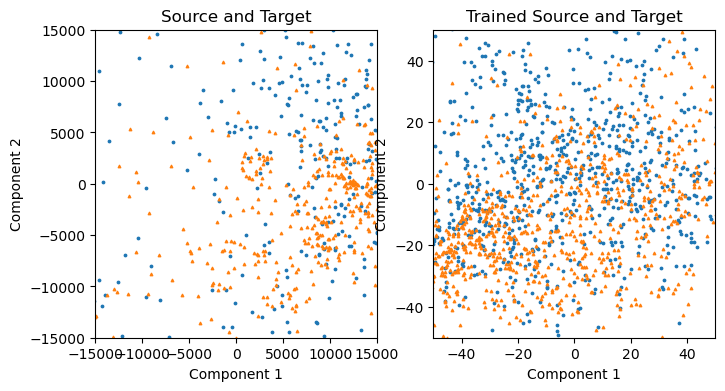

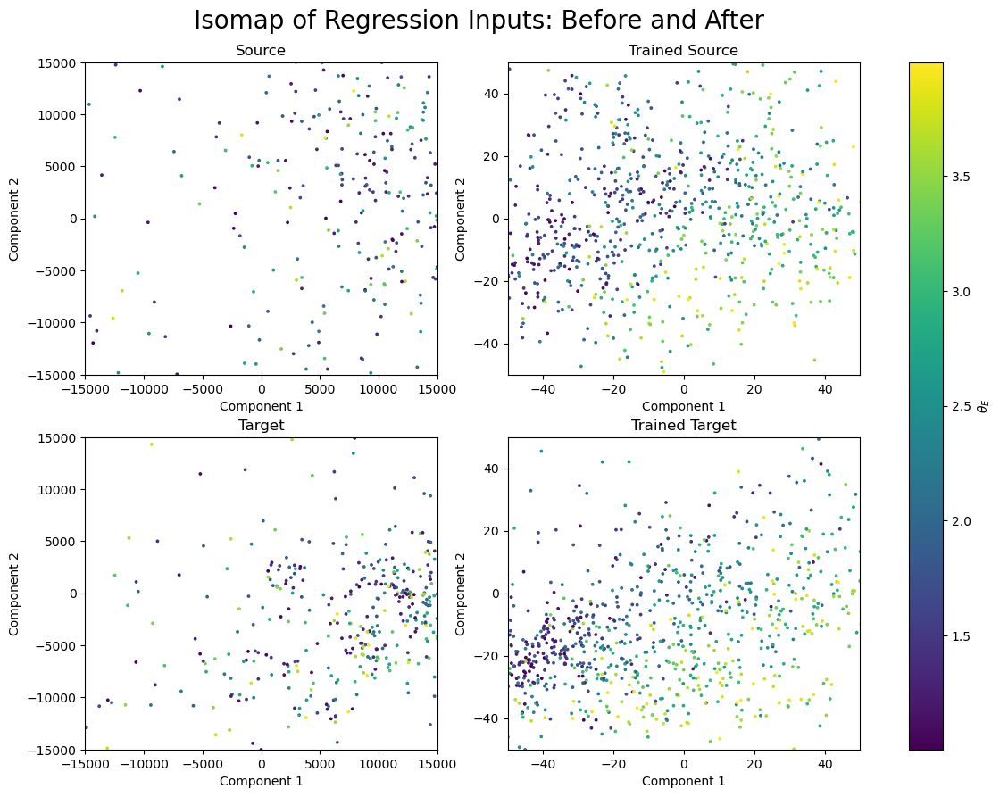


Epoch 90: 32.17s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2267
	Train Regression Loss: : 0.0220
	Train R2 Score: : 0.9688
 Validation Statistics:
	Val Source Regression Loss: : 0.0276
	Val Target Regression Loss: : 0.2827
	Val Source R2 Score: : 0.9611
	Val Target R2 Score: : 0.6101

Epoch 91: 30.03s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2277
	Train Regression Loss: : 0.0216
	Train R2 Score: : 0.9694
 Validation Statistics:
	Val Source Regression Loss: : 0.0275
	Val Target Regression Loss: : 0.2839
	Val Source R2 Score: : 0.9615
	Val Target R2 Score: : 0.6047

Epoch 92: 27.72s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2270
	Train Regression Loss: : 0.0216
	Train R2 Score: : 0.9693
 Validation Statistics:
	Val Source Regression Loss: : 0.0271
	Val Target Regression Loss: : 0.2828
	Val Source R2 Score: : 0.9614
	Val Target R2 Score: : 0.6087

Epoch 93: 28.57s
----------------------------

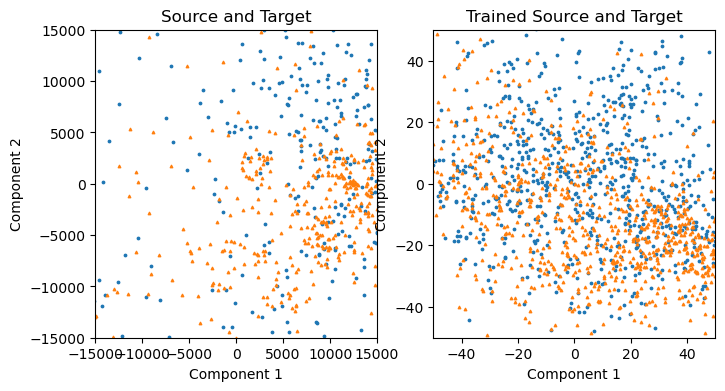

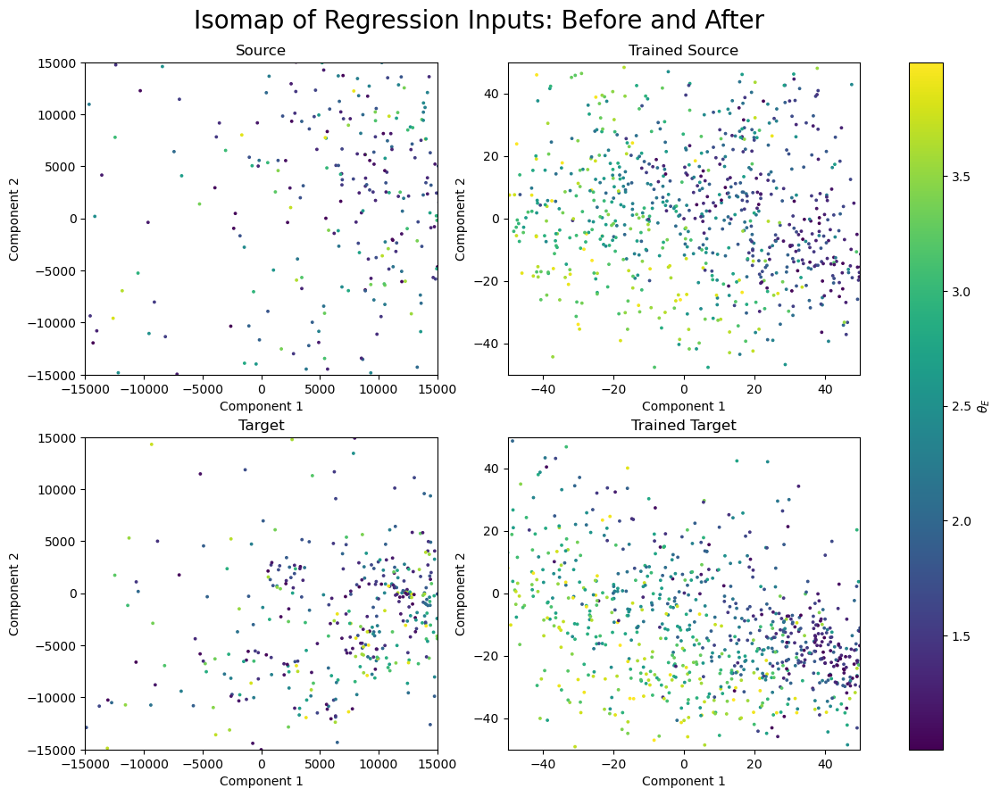


Epoch 95: 28.20s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2276
	Train Regression Loss: : 0.0213
	Train R2 Score: : 0.9698
 Validation Statistics:
	Val Source Regression Loss: : 0.0269
	Val Target Regression Loss: : 0.2805
	Val Source R2 Score: : 0.9623
	Val Target R2 Score: : 0.6167

Epoch 96: 28.08s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2280
	Train Regression Loss: : 0.0210
	Train R2 Score: : 0.9702
 Validation Statistics:
	Val Source Regression Loss: : 0.0261
	Val Target Regression Loss: : 0.2848
	Val Source R2 Score: : 0.9634
	Val Target R2 Score: : 0.6054

Epoch 97: 28.48s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2281
	Train Regression Loss: : 0.0211
	Train R2 Score: : 0.9701
 Validation Statistics:
	Val Source Regression Loss: : 0.0271
	Val Target Regression Loss: : 0.2883
	Val Source R2 Score: : 0.9620
	Val Target R2 Score: : 0.6003

Epoch 98: 21.76s
----------------------------

In [8]:
print("Beginning Training...")
mod_name = "models/real_control_au"
# Train
best_target_R2 = -1.0
for i in range(stats['epoch_no'], stats['epoch_no'] + epochs):
        if (i % 5 == 0):
            print("Generating Isomap...")
            source_iso, target_iso, trained_source_iso, trained_target_iso = generate_isomaps(source_data, target_data, model)
            show_isomaps(source_iso, target_iso, trained_source_iso, trained_target_iso, source_labels, target_labels, mod_name, stats["epoch_no"], 15000, 50, save = True)
            if (len(stats['val_target_r2_score']) > 0) and (stats['val_target_r2_score'][-1] > best_target_R2):
                print("Saving Model...", end = ' ')
                state = {
                        'epoch': stats['epoch_no'],
                        'state_dict': model.state_dict(),
                        'optimizer': optimizer.state_dict(),
                        }
                torch.save(state, mod_name)
                best_target_R2 = stats['val_target_r2_score'][-1]
                print("Done.")
            
        start_time = time.time()
        vals = train_loop(source_train_dataloader, target_train_dataloader, model,
                   regressor_loss_fn, da_loss, optimizer, epochs, i, 0.0 ,0.0)

        vals_validate = test_loop(source_val_dataloader, target_val_dataloader,
                         model, regressor_loss_fn, da_loss, epochs, i)

        stats['train_DA_loss'].append(vals[0])
        stats['train_regression_loss'].append(vals[1])
        stats['train_r2_score'].append(vals[2])
        stats['val_source_regression_loss'].append(vals_validate[1])
        stats['val_target_regression_loss'].append(vals_validate[2])
        stats['val_source_r2_score'].append(vals_validate[3])
        stats['val_target_r2_score'].append(vals_validate[4])
        stats['epoch_no'] += 1

        
        print_epoch_scores(stats, i, time.time() - start_time)

In [8]:
# state = {
#     'epoch': stats['epoch_no'],
#     'state_dict': model.state_dict(),
#     'optimizer': optimizer.state_dict(),
# }

# torch.save(state, mod_name)
json.dump(stats, open(mod_name+'.json', 'w'))

In [17]:
mod_name = "models/mb_lenscolor_jul25_1740"
model.load_state_dict(torch.load(mod_name)['state_dict'])
stats = json.load(open(mod_name+'.json', 'r'))

In [18]:
def generate_isomaps(source_data, target_data, model, n_neighbors = 5, n_components = 2, n_points = 1000):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    gc.collect()
    torch.cuda.empty_cache()
    
    isomap = Isomap(n_neighbors=n_neighbors, n_components=n_components)
    train_isomap = Isomap(n_neighbors=n_neighbors, n_components=n_components)
    
    sdata = source_data.reshape([-1, np.prod(source_data.shape[1:])])[:n_points]
    tdata = target_data.reshape([-1, np.prod(target_data.shape[1:])])[:n_points]
    catdata = np.concatenate((sdata, tdata), axis=0)
    print(catdata.shape)
    isomap = isomap.fit(catdata)
    
    with torch.no_grad():
        source_tensor = torch.FloatTensor(source_data[:n_points]).to(device)
        target_tensor = torch.FloatTensor(target_data[:n_points]).to(device)
        sfeat = model.get_feature(source_tensor).cpu().detach().numpy()
        tfeat = model.get_feature(target_tensor).cpu().detach().numpy()
        catfeat = np.concatenate((sfeat, tfeat), axis=0)
        
    train_isomap = train_isomap.fit(catfeat)
    trained_source_iso = train_isomap.transform(sfeat)
    trained_target_iso = train_isomap.transform(tfeat)
    
    del sfeat
    del tfeat
    
    source_iso = isomap.transform(sdata)
    target_iso = isomap.transform(tdata)

    return source_iso, target_iso, trained_source_iso, trained_target_iso


In [108]:
source_iso, target_iso, trained_source_iso, trained_target_iso = generate_isomaps(source_data, target_data, model)

(2000, 6075)


def show_isomaps(source_iso, 
                 target_iso, 
                 trained_source_iso, 
                 trained_target_iso, 
                 source_labels,
                 target_labels,
                 mod_name, 
                 epoch_no,
                 pretrain_lim = 500,
                 posttrain_lim = 50,
                 save = False):
    
    fig0, axes = plt.subplots(1, 2, figsize=(8, 4))

    (ax1, ax2) = axes
    ax1.scatter(source_iso[:, 0], source_iso[:, 1], s=3, marker='o')
    ax1.scatter(target_iso[:, 0], target_iso[:, 1], s=3, marker='^')
    lval1 = pretrain_lim
    ax1.set_xlim(-lval1, lval1)
    ax1.set_ylim(-lval1, lval1)
    ax1.set_title('Source and Target')
    
    ax2.scatter(trained_source_iso[:, 0], trained_source_iso[:, 1], s=3, marker='o')
    ax2.scatter(trained_target_iso[:, 0], trained_target_iso[:, 1], s=3, marker='^')
    lval2 = posttrain_lim
    ax2.set_xlim(-lval2, lval2)
    ax2.set_ylim(-lval2, lval2)
    ax2.set_title('Trained Source and Target')
    
    ax1.set_xlabel('Component 1')
    ax1.set_ylabel('Component 2')
    ax2.set_xlabel('Component 1')
    ax2.set_ylabel('Component 2')
    
    if save:
        plt.savefig(mod_name + "_" + str(epoch_no) + "_compare.png", bbox_inches = 'tight', dpi = 400)
        
    plt.show()

    fig1, ax = plt.subplots(2, 2, figsize=(14, 10))

    ax1 = ax[0][1]
    scatter1 = ax1.scatter(trained_source_iso[:, 0], trained_source_iso[:, 1], s=3, marker='o', c = source_labels)
    lval1 = posttrain_lim
    ax1.set_xlim(-lval1, lval1)
    ax1.set_ylim(-lval1, lval1)
    ax1.set_title('Trained Source')
    
    ax2 = ax[0][0]
    ax2.scatter(source_iso[:, 0], source_iso[:, 1], s=3, c = source_labels)
    lval2 = pretrain_lim
    ax2.set_xlim(-lval2, lval2)
    ax2.set_ylim(-lval2, lval2)
    ax2.set_title('Source')
    
    ax1 = ax[1][1]
    ax1.scatter(trained_target_iso[:, 0], trained_target_iso[:, 1], s=3, marker='o', c = target_labels)
    lval1 = posttrain_lim
    ax1.set_xlim(-lval1, lval1)
    ax1.set_ylim(-lval1, lval1)
    ax1.set_title('Trained Target')
    
    ax2 = ax[1][0]
    ax2.scatter(target_iso[:, 0], target_iso[:, 1], s=3, c = target_labels)
    lval2 = pretrain_lim
    ax2.set_xlim(-lval2, lval2)
    ax2.set_ylim(-lval2, lval2)
    ax2.set_title('Target')
    
    for i in ax.ravel():
        i.set_xlabel('Component 1')
        i.set_ylabel('Component 2')
    
    cbar = fig.colorbar(scatter1, ax=ax.ravel().tolist(), orientation='vertical')
    cbar.set_label('$\\theta_E$')
    
    plt.suptitle("Isomap of Regression Inputs: Before and After", x = 0.44, y = 0.94, fontsize = 20)
    
    if save:
        plt.savefig(mod_name + "_" + str(epoch_no) + "_thetaE.png", bbox_inches = 'tight', dpi = 400)
        
    plt.show()

    return fig0, axes, fig1, ax

In [9]:
source_labels = pd.read_csv(source_meta)['PLANE_1-OBJECT_1-MASS_PROFILE_1-theta_E-g'].tolist()[:1000]
target_labels = pd.read_csv(target_meta)['PLANE_1-OBJECT_1-MASS_PROFILE_1-theta_E-g'].tolist()[:1000]

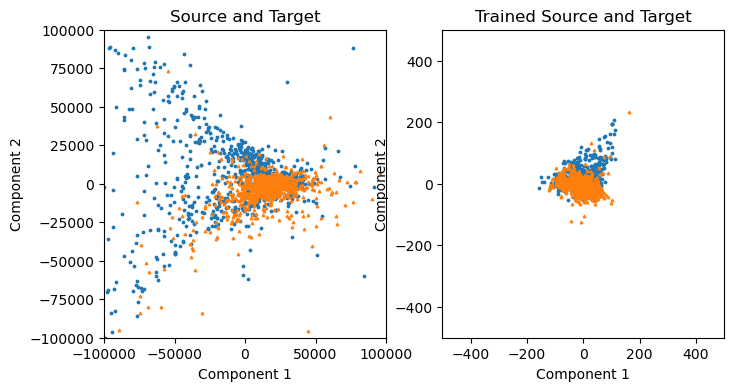

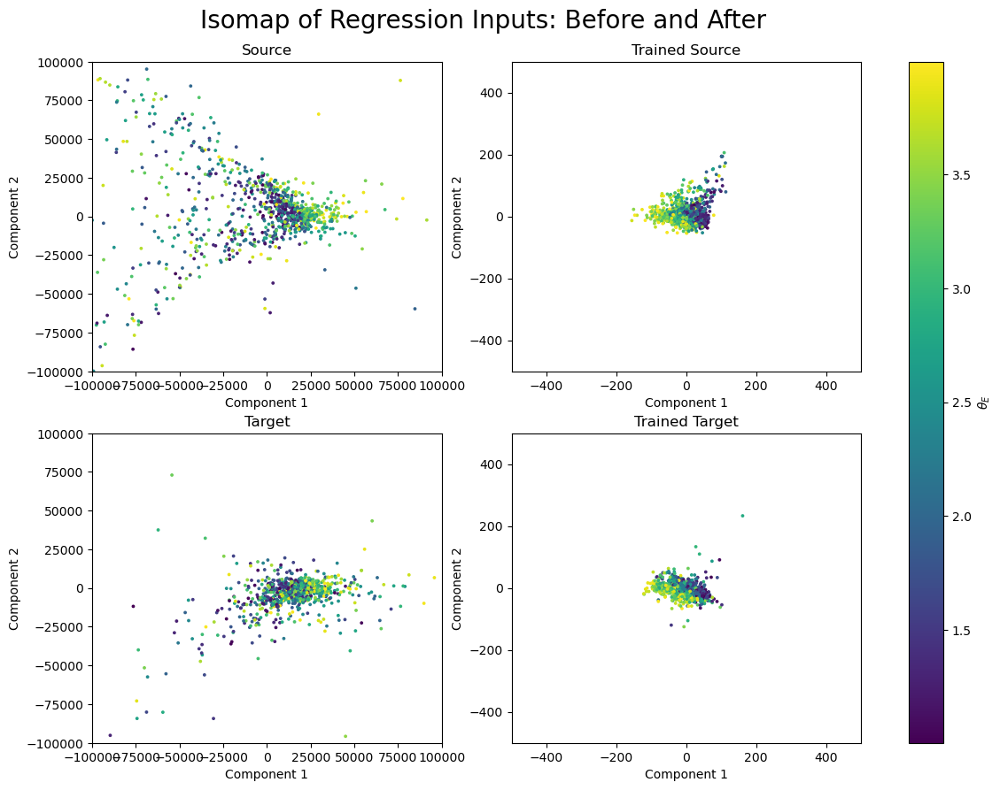

(<Figure size 800x400 with 2 Axes>,
 array([<Axes: title={'center': 'Source and Target'}, xlabel='Component 1', ylabel='Component 2'>,
        <Axes: title={'center': 'Trained Source and Target'}, xlabel='Component 1', ylabel='Component 2'>],
       dtype=object),
 <Figure size 1400x1000 with 5 Axes>,
 array([[<Axes: title={'center': 'Source'}, xlabel='Component 1', ylabel='Component 2'>,
         <Axes: title={'center': 'Trained Source'}, xlabel='Component 1', ylabel='Component 2'>],
        [<Axes: title={'center': 'Target'}, xlabel='Component 1', ylabel='Component 2'>,
         <Axes: title={'center': 'Trained Target'}, xlabel='Component 1', ylabel='Component 2'>]],
       dtype=object))

In [11]:
show_isomaps(source_iso, target_iso, trained_source_iso, trained_target_iso, source_labels, target_labels, mod_name, stats["epoch_no"], 100000, 500)

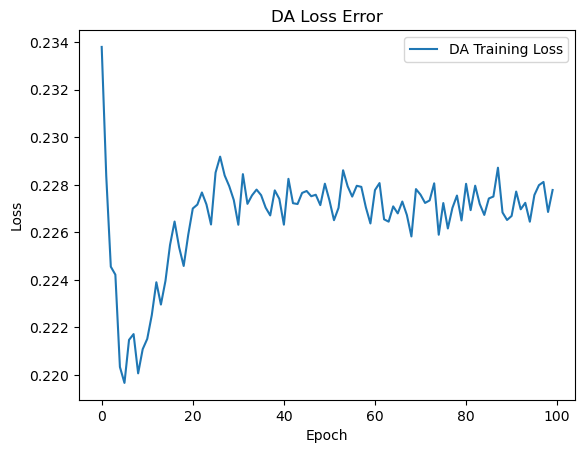

In [12]:
# Classifier
fmt = lambda k: " ".join([i.capitalize() for i in k.split('_')])
eps = np.arange(stats["epoch_no"])
plt.title("DA Loss Error")
plt.plot(eps, stats['train_DA_loss'], label = "DA Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

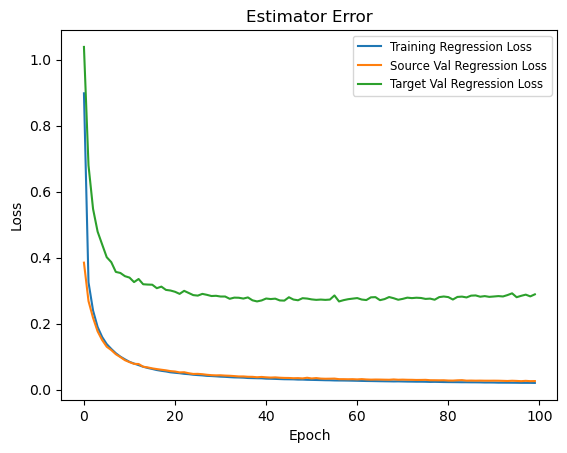

In [13]:
# Estimator
plt.title("Estimator Error")
plt.plot(eps, stats['train_regression_loss'], label = "Training Regression Loss")
plt.plot(eps, stats['val_source_regression_loss'], label = "Source Val Regression Loss")
plt.plot(eps, stats['val_target_regression_loss'], label = "Target Val Regression Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(fontsize = 'small')

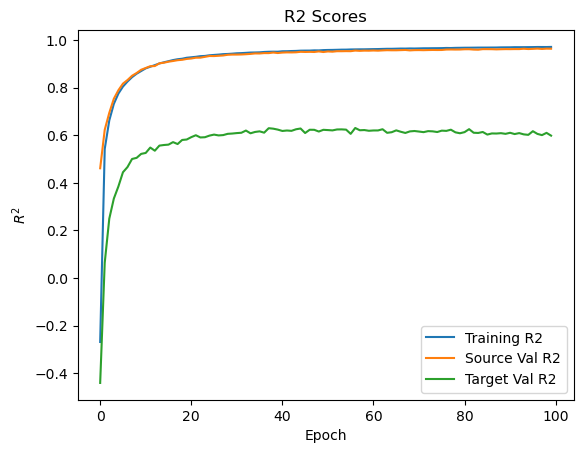

In [14]:
# R2 Scores
plt.title("R2 Scores")
plt.plot(eps, stats['train_r2_score'], label = "Training R2")
plt.plot(eps, stats['val_source_r2_score'], label = "Source Val R2")
plt.plot(eps, stats['val_target_r2_score'], label = "Target Val R2")
plt.xlabel("Epoch")
plt.ylabel("$R^2$")
plt.legend()

Source R2 Score is 0.9629


Text(0.5, 1.0, 'MMD | Source | R2: 0.963')

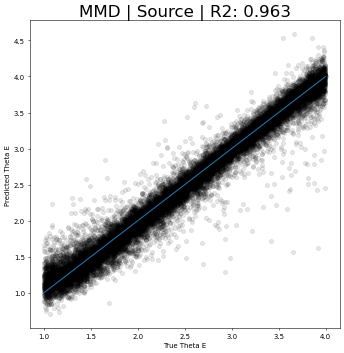

In [15]:
# Test Source
preds = np.array([])
true = np.array([])
score_list = np.array([])

with torch.no_grad():
    for X, y in source_test_dataloader:
        X = X.float()
        pred, _ = model(X.cuda())
        preds = np.append(preds, pred.cpu())
        true = np.append(true, y.cpu())
        score = r2_score(y.cpu(), pred.cpu())
        score_list = np.append(score_list, score)

score = np.mean(score_list)
print(f'Source R2 Score is {score:.4f}')

plt.figure(figsize=(8,8),dpi=50)
plt.scatter(true, preds,  color='black', alpha = 0.1)
line = np.linspace(1, 4, 100)
plt.plot(line, line)
plt.rc('font', size=12)
plt.xlabel('True Theta E')
plt.ylabel('Predicted Theta E');
plt.rc('font', size=20)
plt.title('MMD | Source | R2: {0:.3f}'.format(score))

Target R2 Score is 0.6156


Text(0.5, 1.0, 'MMD | Target | R2: 0.616')

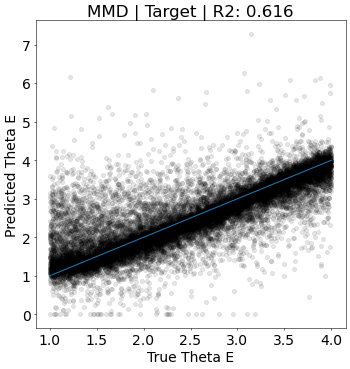

In [16]:
# Test target
preds = np.array([])
true = np.array([])
score_list = np.array([])


with torch.no_grad():
    for X, y in target_test_dataloader:
        X = X.float()
        pred, _ = model(X.cuda())
        preds = np.append(preds, pred.cpu())
        true = np.append(true, y.cpu())
        score = r2_score(y.cpu(), pred.cpu())
        score_list = np.append(score_list, score)

score = np.mean(score_list)
print(f'Target R2 Score is {score:.4f}')

plt.figure(figsize=(8,8),dpi=50)
plt.scatter(true, preds,  color='black', alpha = 0.1)
line = np.linspace(1, 4, 100)
plt.plot(line, line)
plt.rc('font', size=12)
plt.xlabel('True Theta E')
plt.ylabel('Predicted Theta E');
plt.rc('font', size=20)
plt.title('MMD | Target | R2: {0:.3f}'.format(score))

In [56]:
X.shape

torch.Size([32, 3, 45, 45])

In [58]:
preds = np.array([])
true = np.array([])
imgs = None

with torch.no_grad():
    for X, y in target_test_dataloader:
        X = X.float()
        pred, _ = model(X.cuda())
        preds = np.append(preds, pred.cpu())
        true = np.append(true, y.cpu())
        if imgs is None:
            imgs = X
        else: 
            imgs =  np.concatenate((imgs, X), axis=0)
        score = r2_score(y.cpu(), pred.cpu())
        score_list = np.append(score_list, score)

In [64]:
preds.shape

(20000,)

In [63]:
true.shape

(20000,)

In [62]:
imgs.shape

(20000, 3, 45, 45)

In [112]:
idx = (np.abs(true - preds) > 0.7)

In [80]:
preds

array([1.30214167, 2.98077202, 2.00425458, ..., 0.95970899, 3.07219529,
       2.18891573])

In [81]:
true

array([1.69164467, 3.9343679 , 2.13911223, ..., 1.52133608, 2.09088802,
       2.36884522])

3.9343678951263428
2.980772018432617


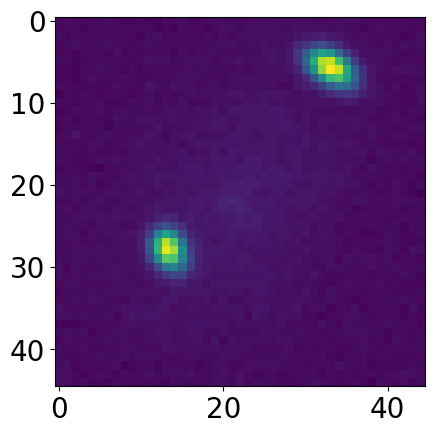

In [82]:
i = 0
b = 0
plt.imshow(imgs[idx][i, b, :, :])
print(true[idx][0])
print(preds[idx][0])

1.154159426689148
2.234156370162964


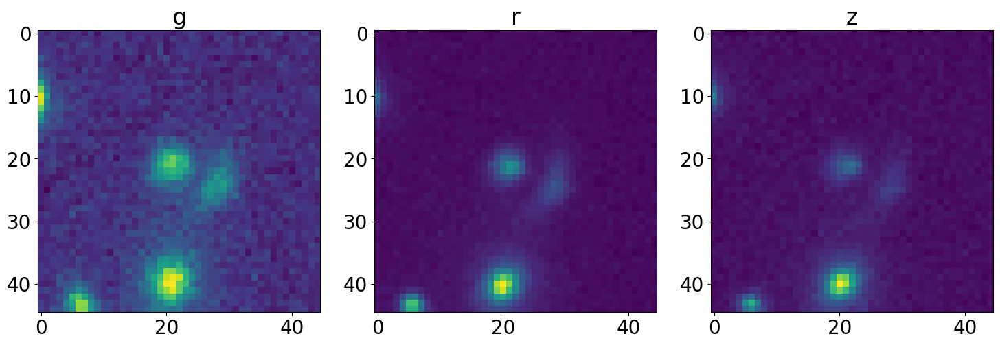

In [117]:
i = 134
# Create a figure with 3 subplots arranged horizontally
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# First subplot
axs[0].imshow(imgs[idx][i, 0, :, :])
axs[0].set_title('g')

# Second subplot
axs[1].imshow(imgs[idx][i, 1, :, :])
axs[1].set_title('r')

# Third subplot
axs[2].imshow(imgs[idx][i, 2, :, :])
axs[2].set_title('z')

# Adjust layout to prevent overlap
plt.tight_layout()

print(true[idx][i])
print(preds[idx][i])
# Show the plot
plt.show()

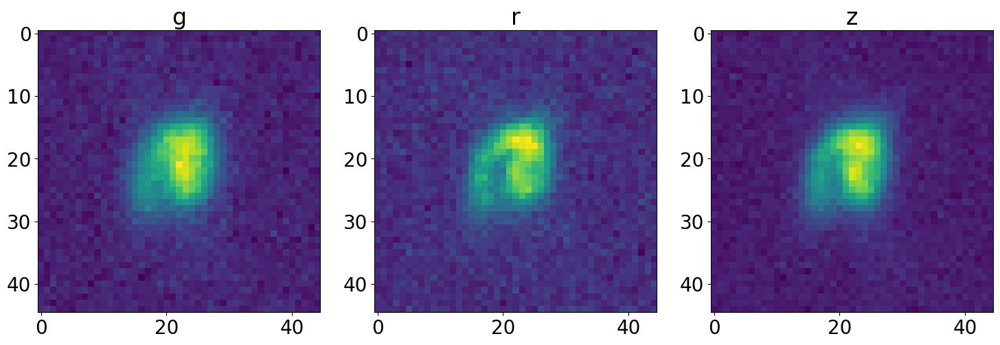

In [105]:
i = 16
# Create a figure with 3 subplots arranged horizontally
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# First subplot
axs[0].imshow(source_data[i, 0, :, :])
axs[0].set_title('g')

# Second subplot
axs[1].imshow(source_data[i, 1, :, :])
axs[1].set_title('r')

# Third subplot
axs[2].imshow(source_data[i, 2, :, :])
axs[2].set_title('z')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()